## <a name="0.0"></a>Содержание:
* [0. Описание проекта, описание данных, загрузка и импорт библиотек](#0.)
* [1. Загрузка и изучение данных:](#1.)
     - [1.1. Таблица visits](#1.1.)
     - [1.2. Таблица orders](#1.2.)
     - [1.3. Таблица costs](#1.3.)
* [2. Анализ данных по продукту (DAU, WAU, MAU, Retention)](#2.)
     - [2.1. Подготовка данных](#2.1.)
     - [2.2. Визуализация](#2.2.)
     - [2.3. Выводы](#2.3.)
     - [2.4. Retention Heatmap (с относительными и абсолютными величинами)](#2.4.)
* [3. Анализ данных по продажам](#3.)
     - [3.1. Когда люди начинают покупать?](#3.1.)
     - [3.2. Сколько раз покупают за период?](#3.2.)
     - [3.3. Какой средний чек?](#3.3.)
     - [3.4. Сколько денег приносят? (LTV)](#3.4.)
       + [3.4.1. Heatmap LTV при margin_rate = 0.5](#3.4.1.)
       + [3.4.2. Heatmap LTV при margin_rate = 1](#3.4.2.)
* [4. Анализ данных по маркетингу](#4.)
     - [4.1. Сколько денег потратили? Всего / на каждый источник / по времени?<br/>
Сколько стоило привлечение одного покупателя из каждого источника?<br/>](#4.1.)
       + [4.1.1. График соотношения между затратами и выручкой](#4.1.1.)
       + [4.1.2. Помесячная выручка с отображением вклада каждой когорты](#4.1.2.)
       + [4.1.3. Затраты на рекламу по времени](#4.1.3.)
       + [4.1.4. Затраты по источникам рекламы](#4.1.4.)
       + [4.1.5. Количество привлеченных пользователей по источникам рекламы](#4.1.5.)
       + [4.1.6. Выручка по источникам рекламы](#4.1.6.)
       + [4.1.7. Затраты, выручка и количество привлеченных пользователей по источникам рекламы](#4.1.7.)
       + [4.1.8. Сколько стоило привлечение одного покупателя из каждого источника](#4.1.8.)
       + [4.1.9. Выводы по выгодности использования каждого рекламного канала](#4.1.9.)
     - [4.2. Анализ посещаемости ресурса по типу устройства](#4.2.)
     - [4.3. CAC, ROMI](#4.3.)
       + [4.3.1. Функции для heatmap и stacked-bar](#4.3.1.)     
       + [4.3.2. ROMI при margin_rate = 0.5](#4.3.2.)         
       + [4.3.3. ROMI при margin_rate = 1](#4.3.3.)
* [5. Общий вывод](#5.)

# Описание проекта<a name="0."></a>
<font size="2">([к содержанию](#0.0))</font><br/>

Вас пригласили на стажировку в отдел аналитики <b>Яндекс.Афиши</b>. Первое задание: помочь маркетологам оптимизировать маркетинговые затраты.

У вас в распоряжении есть данные от Яндекс.Афиши с <b>июня 2017 по конец мая 2018 года</b>:
* лог сервера с данными о посещениях сайта Яндекс.Афиши;
* выгрузка всех заказов за этот период;
* статистика рекламных расходов.

<b>Вы изучите:</b>
* как люди пользуются продуктом;
* когда они начинают покупать;
* сколько денег приносит каждый клиент;
* когда клиент окупается.

# Описание данных
<font size="2">([к содержанию](#0.0))</font><br/>

Таблица <b>visits</b> (лог сервера с информацией о посещениях сайта):
* <b>Uid</b> — уникальный идентификатор пользователя;
* <b>Device</b> — категория устройства пользователя;
* <b>Start Ts</b> — дата и время начала сессии;
* <b>End Ts</b> — дата и время окончания сессии;
* <b>Source Id</b> — идентификатор рекламного источника, из которого пришел пользователь.

Таблица <b>orders</b> (информация о заказах):
* <b>Uid</b> — уникальный id пользователя, который сделал заказ;
* <b>Buy Ts</b> — дата и время заказа;
* <b>Revenue</b> — выручка Яндекс.Афиши с этого заказа.

Таблица <b>costs</b> (информация о затратах на маркетинг):
* <b>source_id</b> — идентификатор рекламного источника;
* <b>dt</b> — дата;
* <b>costs</b> — затраты на этот рекламный источник в этот день.

# Загрузка библиотек
<font size="2">([к содержанию](#0.0))</font><br/>

In [1]:
!pip install bokeh

In [2]:
!pip install pandas-bokeh

In [3]:
!pip install hvplot

# Импорт библиотек
<font size="2">([к содержанию](#0.0))</font><br/>

Loading BokehJS ...

<img src='data:image/png;base64,iVBORw0KGgoAAAANSUhEUgAAAEAAAABACAYAAACqaXHeAAAABHNCSVQICAgIfAhkiAAAAAlwSFlz
AAAB+wAAAfsBxc2miwAAABl0RVh0U29mdHdhcmUAd3d3Lmlua3NjYXBlLm9yZ5vuPBoAAA6zSURB
VHic7ZtpeFRVmsf/5966taWqUlUJ2UioBBJiIBAwCZtog9IOgjqACsogKtqirT2ttt069nQ/zDzt
tI4+CrJIREFaFgWhBXpUNhHZQoKBkIUASchWla1S+3ar7r1nPkDaCAnZKoQP/D7mnPOe9/xy76n3
nFSAW9ziFoPFNED2LLK5wcyBDObkb8ZkxuaoSYlI6ZcOKq1eWFdedqNzGHQBk9RMEwFAASkk0Xw3
ETacDNi2vtvc7L0ROdw0AjoSotQVkKSvHQz/wRO1lScGModBFbDMaNRN1A4tUBCS3lk7BWhQkgpD
lG4852/+7DWr1R3uHAZVQDsbh6ZPN7CyxUrCzJMRouusj0ipRwD2uKm0Zn5d2dFwzX1TCGhnmdGo
G62Nna+isiUqhkzuKrkQaJlPEv5mFl2fvGg2t/VnzkEV8F5ioioOEWkLG86fvbpthynjdhXYZziQ
x1hC9J2NFyi8vCTt91Fh04KGip0AaG9zuCk2wQCVyoNU3Hjezee9bq92duzzTmxsRJoy+jEZZZYo
GTKJ6SJngdJqAfRzpze0+jHreUtPc7gpBLQnIYK6BYp/uGhw9YK688eu7v95ysgshcg9qSLMo3JC
4jqLKQFBgdKDPoQ+Pltb8dUyQLpeDjeVgI6EgLIQFT5tEl3rn2losHVsexbZ3EyT9wE1uGdkIPcy
BGxn8QUq1QrA5nqW5i2tLqvrrM9NK6AdkVIvL9E9bZL/oyfMVd/jqvc8LylzRBKDJSzIExwhQzuL
QYGQj4rHfFTc8mUdu3E7yoLtbTe9gI4EqVgVkug2i5+uXGo919ixbRog+3fTbQ8qJe4ZOYNfMoTI
OoshUNosgO60AisX15aeI2PSIp5KiFLI9ubb1vV3Qb2ltwLakUCDAkWX7/nHKRmmGIl9VgYsUhJm
2NXjKYADtM1ygne9QQDIXlk49FBstMKx66D1v4+XuQr7vqTe0VcBHQlRWiOCbmmSYe2SqtL6q5rJ
zsTb7lKx3FKOYC4DoqyS/B5bvLPxvD9Qtf6saxYLQGJErmDOdOMr/zo96km1nElr8bmPOBwI9COv
HnFPRIwmkSOv9kcAS4heRsidOkpeWBgZM+UBrTFAXNYL5Vf2ii9c1trNzpYdaoVil3WIc+wdk+gQ
noie3ecCcxt9ITcLAPWt/laGEO/9U6PmzZkenTtsSMQ8uYywJVW+grCstAvCIaAdArAsIWkRDDs/
KzLm2YcjY1Lv0UdW73HabE9n6V66cxSzfEmuJssTpKGVp+0vHq73FwL46eOjpMpbRAnNmJFrGJNu
Ukf9Yrz+3rghiumCKNXXWPhLYcjxGsIpoCMsIRoFITkW8AuyM8jC1+/QLx4bozCEJIq38+1rtpR6
V/yzb8eBlRb3fo5l783N0CWolAzJHaVNzkrTzlEp2bQ2q3TC5gn6wpnoQAmwSiGh2GitnTmVMc5O
UyfKWUKCIsU7+fZDKwqdT6DDpvkzAX4/+AMFjk0tDp5GRXLpQ2MUmhgDp5gxQT8+Y7hyPsMi8uxF
71H0oebujHALECjFKaW9Lm68n18wXp2kVzIcABytD5iXFzg+WVXkegpAsOOYziqo0OkK76GyquC3
ltZAzMhhqlSNmmWTE5T6e3IN05ITFLM4GdN0vtZ3ob8Jh1NAKXFbm5PtLU/eqTSlGjkNAJjdgn/N
aedXa0tdi7+t9G0FIF49rtMSEgAs1kDLkTPO7ebm4IUWeyh1bKomXqlgMG6kJmHcSM0clYLJ8XtR
1GTnbV3F6I5wCGikAb402npp1h1s7LQUZZSMIfALFOuL3UUrfnS8+rez7v9qcold5tilgHbO1fjK
9ubb17u9oshxzMiUBKXWqJNxd+fqb0tLVs4lILFnK71H0Ind7uiPgACVcFJlrb0tV6DzxqqTIhUM
CwDf1/rrVhTa33/3pGPxJYdQ2l2cbgVcQSosdx8uqnDtbGjh9SlDVSMNWhlnilfqZk42Th2ZpLpf
xrHec5e815zrr0dfBZSwzkZfqsv+1FS1KUknUwPARVvItfKUY+cn57yP7qv07UE3p8B2uhUwLk09
e0SCOrK+hbdYHYLjRIl71wWzv9jpEoeOHhGRrJAzyEyNiJuUqX0g2sBN5kGK6y2Blp5M3lsB9Qh4
y2Ja6x6+i0ucmKgwMATwhSjdUu49tKrQ/pvN5d53ml2CGwCmJipmKjgmyuaXzNeL2a0AkQ01Th5j
2DktO3Jyk8f9vcOBQHV94OK+fPumJmvQHxJoWkaKWq9Vs+yUsbq0zGT1I4RgeH2b5wef7+c7bl8F
eKgoHVVZa8ZPEORzR6sT1BzDUAD/d9F78e2Tzv99v8D+fLVTqAKAsbGamKey1Mt9Ann4eH3gTXTz
idWtAJ8PQWOk7NzSeQn/OTHDuEikVF1R4z8BQCy+6D1aWRfY0tTGG2OM8rRoPaeIj5ZHzJxszElN
VM8K8JS5WOfv8mzRnQAKoEhmt8gyPM4lU9SmBK1MCQBnW4KONT86v1hZ1PbwSXPw4JWussVjtH9Y
NCoiL9UoH/6PSu8jFrfY2t36erQHXLIEakMi1SydmzB31h3GGXFDFNPaK8Rme9B79Ixrd0WN+1ij
NRQ/doRmuFLBkHSTOm5GruG+pFjFdAmorG4IXH1Qua6ASniclfFtDYt+oUjKipPrCQB7QBQ2lrgP
fFzm+9XWUtcqJ3/5vDLDpJ79XHZk3u8nGZ42qlj1+ydtbxysCezrydp6ugmipNJ7WBPB5tydY0jP
HaVNzs3QzeE4ZpTbI+ZbnSFPbVOw9vsfnVvqWnirPyCNGD08IlqtYkh2hjZ5dErEQzoNm+6ykyOt
Lt5/PQEuSRRKo22VkydK+vvS1XEKlhCJAnsqvcVvH7f/ZU2R67eXbMEGAMiIV5oWZWiWvz5Fv2xG
sjqNJQRvn3Rs2lji/lNP19VjAQDgD7FHhujZB9OGqYxRkZxixgRDVlqS6uEOFaJUVu0rPFzctrnF
JqijImVp8dEKVWyUXDk92zAuMZ6bFwpBU1HrOw6AdhQgUooChb0+ItMbWJitSo5Ws3IAOGEOtL53
0vHZih9sC4vtofZ7Qu6523V/fmGcds1TY3V36pUsBwAbSlxnVh2xLfAD/IAIMDf7XYIkNmXfpp2l
18rkAJAy9HKFaIr/qULkeQQKy9zf1JgDB2uaeFNGijo5QsUyacNUUTOnGO42xSnv4oOwpDi1zYkc
efUc3I5Gk6PhyTuVKaOGyLUAYPGIoY9Pu/atL/L92+4q9wbflRJ2Trpm/jPjdBtfnqB/dIThcl8A
KG7hbRuKnb8qsQsVvVlTrwQAQMUlf3kwJI24Z4JhPMtcfng5GcH49GsrxJpGvvHIaeem2ma+KSjQ
lIwUdYyCY8j4dE1KzijNnIP2llF2wcXNnsoapw9XxsgYAl6k+KzUXbi2yP3KR2ecf6z3BFsBICdW
nvnIaG3eHybqX7vbpEqUMT+9OL4Qpe8VON7dXuFd39v19FoAABRVePbGGuXTszO0P7tu6lghUonE
llRdrhArLvmKdh9u29jcFiRRkfLUxBiFNiqSU9icoZQHo5mYBI1MBgBH6wMNb+U7Pnw337H4gi1Y
ciWs+uks3Z9fztUvfzxTm9Ne8XXkvQLHNytOOZeiD4e0PgkAIAYCYknKUNUDSXEKzdWNpnil7r4p
xqkjTarZMtk/K8TQ6Qve78qqvXurGwIJqcOUKfUWHsm8KGvxSP68YudXq4pcj39X49uOK2X142O0
Tz5/u/7TVybqH0rSya6ZBwD21/gubbrgWdDgEOx9W
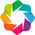

In [4]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.ticker import FuncFormatter
import datetime
import decimal
from PIL import Image

from bokeh.models.widgets import DataTable, DateFormatter, TableColumn, RadioButtonGroup, Select
from bokeh.plotting import ColumnDataSource, figure, show
from bokeh.io import output_file, reset_output, output_notebook
from bokeh.models.widgets import Tabs, Panel, Div
from bokeh.models import Span, Range1d, CustomJS, TextInput, HoverTool, FactorRange
from bokeh.models import WheelZoomTool, NumeralTickFormatter, Legend, BoxAnnotation
from bokeh.layouts import layout, row, column, widgetbox, gridplot
from bokeh.models import SingleIntervalTicker, LinearAxis, Label, Span, CheckboxGroup
from bokeh.transform import dodge
output_notebook()

%matplotlib inline

import seaborn as sns
import holoviews as hv
from holoviews import dim, opts
hv.extension('bokeh')

import warnings
warnings.filterwarnings('ignore')

<a name="1."></a><br/>
<font size="5"><b>1. Загрузка и изучение данных</b></font>.<br/>
<font size="2">([к содержанию](#0.0))</font><br/>

In [5]:
visits = pd.read_csv('/datasets/visits_log.csv')
orders = pd.read_csv('/datasets/orders_log.csv')
costs = pd.read_csv('/datasets/costs.csv')

Посмотрим общие данные (часть её данных, содержание NaN, типы и характеристики столбцов) по каждой из таблиц:<br/><br/>
Для этого напишем функцию:

In [6]:
def create_bokeh_report(df, df_name='df', missingno=True, advice=True, 
                        table_width=500, table_height = 400, show_zeros=True):
    reset_output()
    output_notebook()

    df_height = df.shape[0]
    df_width = df.shape[1]
    
    if df_height > 30000:
        df = df[:30000]

    z = df.notnull().values
    g = np.zeros((df.shape[0], df.shape[1], 3))

    color = (0.25, 0.25, 0.25) # gray

    g[z < 0.5] = [255, 255, 255]
    g[z > 0.5] = color

    xdim, ydim = df.shape[1], df.shape[0]
    img = np.empty((ydim, xdim), dtype=np.uint32)
    view = img.view(dtype=np.uint8).reshape((ydim, xdim, 4))
    view[:,:,0] = g[:,:,0] # copy red channel
    view[:,:,1] = g[:,:,1] # copy blue channel
    view[:,:,2] = g[:,:,2] # copy green channel
    view[:,:,3] = 255 # Alpha
    
    img = img[::-1]
    NaNs = figure(title="NaNs count, %", x_range=(-1,xdim+xdim/16), y_range=(0,ydim+0.2*ydim), 
                  width=table_width, height=400, tools='pan, wheel_zoom, reset')
    NaNs.image_rgba(image=[img], x=0, y=0, dw=xdim, dh=ydim)
    i_columns = 0.4
    for label in df.columns:
        label1, label2 = label, label
        count_nulls_perc = df[label].count()/len(df)
        if len(label1) > 17:
            text_label1_font_size = '8pt'
        elif len(label1) > 12:
            text_label1_font_size = '9pt'
        else:
            text_label1_font_size = '11pt'

        label1 = Label(x=[i_columns, i_columns + 0.1][len(label1)<7], y=[ydim*1.01, ydim*1.05][len(label1)<7], 
                       text=label1, text_font_size=text_label1_font_size, angle=3/4)
        NaNs.add_layout(label1)
        if show_zeros:
            label2 = Label(x=i_columns+0.3, y=ydim*1.01, text='{:.2%}'.format(1-count_nulls_perc), 
                           text_font_size='10pt', angle=3/4)
            NaNs.add_layout(label2)
        elif 1-count_nulls_perc > 0:
            label2 = Label(x=i_columns+0.3, y=ydim*1.01, text='{:.2%}'.format(1-count_nulls_perc), 
                           text_font_size='10pt', angle=3/4)
            NaNs.add_layout(label2)
        i_columns += 1
        
    y_min_label = Label(x=-0.1*xdim, y=-ydim*0.01, text='1', text_font_size='10pt')
    NaNs.add_layout(y_min_label)
    y_max_label = Label(x=-0.1*xdim-len(str(df_height))/25, y=ydim*1.01, text='{}'.format(df_height), 
                        text_font_size='10pt')
    NaNs.add_layout(y_max_label)
    
    # линии
    for column_count in range(1, len(df.columns)):
        line = NaNs.line([column_count, column_count], [0, ydim], color='white')
        NaNs.add_layout(line)
    
    NaNs.xaxis.visible = None
    NaNs.yaxis.visible = None
    NaNs.xgrid.grid_line_color = None
    NaNs.ygrid.grid_line_color = None
    NaNs.outline_line_alpha = 0 
    
    # выбор отображения датафрейма
    
    mask = df.isnull().any(axis=1)
    df_NaNs = df[mask][:30]
    df_no_NaNs = df[~mask][30:60]
    source_df = ColumnDataSource(data=df.sample(30))
    source_NaNs = ColumnDataSource(data=df_NaNs)
    source_no_NaNs = ColumnDataSource(data=df_no_NaNs)
    source_full_df = ColumnDataSource(data=df)
    source_fill = ColumnDataSource(data=df.sample(30))
    
    select = Select(title='Dataframe to show:', value='Sample(30)', 
                    options=["Sample(30)", "Rows with NaNs", "Rows w/o NaNs", "Full_df"], width=150)
    
    update = CustomJS(args=dict(source_fill=source_fill, source_df=source_df, source_NaNs=source_NaNs,
        source_no_NaNs=source_no_NaNs, source_full_df=source_full_df), code="""

    var f = cb_obj.value;

    if (f == 'Sample(30)') {
        source_fill.data = source_df.data;
    }
    if (f == 'Rows with NaNs') {
        source_fill.data = source_NaNs.data;
    }
    if (f == 'Rows w/o NaNs') {
        source_fill.data = source_no_NaNs.data;
    }
    if (f == 'Full_df') {
        source_fill.data = source_full_df.data;
    }

    source_fill.change.emit();
    """)
    
    select.js_on_change('value', update)
    
    div_common = Div(text="""DataFrame <b>"{dfname}"</b> consists of <b>{shape0} rows</b> and <b>{shape1} columns</b>.<br/>
                      It has <b>{NaNs} NaNs</b>.""".format(dfname = df_name, shape0 = df_height, shape1 = df_width,
                                                   NaNs = df.isnull().sum().sum()),
    width=200, height=100)
    
    df_describe = df.describe(include='all')
    df_describe = df_describe.fillna('')
    df_describe = df_describe.drop(['count', 'top', 'freq'], axis=0)
    curr_rows = df_describe.index.values
    df_describe.loc['type', :] = 1
    df_describe.loc['NaNs, %', :] = 1
    for column_count in range(len(df_describe.columns)):
        df_describe.iloc[-2, column_count] = df.iloc[:,column_count].dtype.name
        df_describe.iloc[-1, column_count] = '{:.2f}'.format(1 - len(df.iloc[:,column_count])/
                                                             df.iloc[:,column_count].count())

    df_describe = df_describe.reindex([df_describe.index.values[-2], df_describe.index.values[-1], *curr_rows])
    
    div_info = Div(text="""{dfinfo}""".format(dfinfo = df_describe.to_html()),
    width=200, height=100)

    radio_button_group = RadioButtonGroup(labels=["Sample(30)", "Rows with NaNs", "Rows w/o NaNs", "Full_df"], active=1)
    radio_button_group.js_on_change('active', update)
    
    Columns = [TableColumn(field=column, title=column) for column in df.columns]
    data_table = DataTable(columns=Columns, source=source_fill, width=table_width, height=table_height,
                           selectable=False) 
    
    # виджет текста
    widgets_layout = column(Div(), row(Div(), div_common, spacing=-160), spacing=85)
    
    #гистограммы
    int_columns = df._get_numeric_data().columns.to_list()
    hists = ['hist' + str(x+1) for x in range(len(int_columns))]
    hists_for_layout = []
    for i in range(len(int_columns)):
        series_to_plot = df[int_columns[i]]
        measured = series_to_plot.values
        hist, edges = np.histogram(measured, density=True, bins=100)
        hists[i] = figure(title='Histogram of {}'.format(int_columns[i]), plot_width = 400, plot_height=300,
                          tools='pan, zoom_in, reset', background_fill_color="#fafafa")
        hists[i].quad(top=hist, bottom=0, left=edges[:-1], right=edges[1:],
           fill_color="navy", line_color="white", alpha=0.5)
        hists[i].y_range.start = 0
        hists[i].xaxis.axis_label = 'x'
        hists[i].yaxis.axis_label = 'Pr(x)'
        hists[i].grid.grid_line_color="white"
        right = series_to_plot.quantile(0.99)
        hists[i].x_range=Range1d(0, right)
        hists_for_layout.append(hists[i])
    
    l1 = layout([[data_table, select, widgets_layout]])
    l2 = layout([[NaNs]])
    l3 = layout([[div_info]])
    l4 = layout([[*hists_for_layout]])
    
    tab1 = Panel(child=l1, title=df_name)
    tab2 = Panel(child=l2, title='NaNs')
    tab3 = Panel(child=l3, title='Info')
    tab4 = Panel(child=l4, title='Histograms')
    
    tabs = Tabs(tabs=[tab1, tab2, tab3, tab4])

    show(row(tabs))

<a name="1.1."></a><br/>
<b>1.1. Смотрим таблицу visits:</b>.<br/>
<font size="2">([к содержанию](#0.0))</font><br/>

In [7]:
visits = visits.rename(columns={'End Ts': 'session_end', 'Start Ts': 'session_start'})
visits.columns = visits.columns.str.lower()

create_bokeh_report(visits, 'visits', table_width=650)

Loading BokehJS ...

Столбцы <b>session_start</b> и <b>session_end</b> имеют тип <b>object</b>, хотя там дата и время. Изменим формат данных в них:

In [8]:
visits['session_start'] = pd.to_datetime(visits['session_start'])
visits['session_end'] = pd.to_datetime(visits['session_end'])

<a name="1.2."></a><br/>
<b>1.2. Смотрим таблицу orders:</b>.<br/>
<font size="2">([к содержанию](#0.0))</font><br/>

In [9]:
orders = orders.rename(columns={'Buy Ts': 'date_of_purchase'})
orders.columns = orders.columns.str.lower()

create_bokeh_report(orders, 'orders')

Loading BokehJS ...

Столбец <b>date_of_purchase</b> имеет тип <b>object</b>, хотя там дата и время. Изменим формат данных в нём:

In [10]:
orders['date_of_purchase'] = pd.to_datetime(orders['date_of_purchase'])

In [11]:
orders.dtypes

date_of_purchase    datetime64[ns]
revenue                    float64
uid                         uint64
dtype: object

По столбцу <b>revenue</b> не указаны единицы измерения. Предполагаю, что это <b>"тысяч рублей"</b>, учитывая то, какие, в среднем, значения там присутствуют. Будем использовать эту аннотацию далее.

<a name="1.3."></a><br/>
<b>1.3. Смотрим таблицу costs:</b>.<br/>
<font size="2">([к содержанию](#0.0))</font><br/>

In [12]:
costs = costs.rename(columns={'dt': 'date'})
costs.columns = costs.columns.str.lower()

create_bokeh_report(costs, 'costs')

Loading BokehJS ...

Столбец <b>date</b> имеет тип <b>object</b>, хотя там дата и время. Изменим формат данных в нём:

In [13]:
costs['date'] = pd.to_datetime(costs['date'], format='%Y-%m-%d')

По столбцу <b>costs</b> не указаны единицы измерения. По аналогии с <b>revenue</b> из таблицы <b>orders</b> примем единицу измерения - <b>"тысяч рублей"</b>.

<hr style="border: 1px solid #000;">

<a name="2."></a><br/>
<font size="5"><b>2. Анализ данных по продукту</b></font>.<br/>
<font size="2">([к содержанию](#0.0))</font><br/>
* 2.1. Сколько людей пользуются в день, неделю, месяц?
* 2.2. Сколько сессий в день?
* 2.3. Сколько длится одна сессия?
* 2.4. Как часто люди возвращаются?

<br/>
Работать будем с датафреймом <b>visits</b>.

In [14]:
visits.head(10)

,device,session_end,source id,session_start,uid
0,touch,2017-12-20 17:38:00,4,2017-12-20 17:20:00,16879256277535980062
1,desktop,2018-02-19 17:21:00,2,2018-02-19 16:53:00,104060357244891740
2,touch,2017-07-01 01:54:00,5,2017-07-01 01:54:00,7459035603376831527
3,desktop,2018-05-20 11:23:00,9,2018-05-20 10:59:00,16174680259334210214
4,desktop,2017-12-27 14:06:00,3,2017-12-27 14:06:00,9969694820036681168
5,desktop,2017-09-03 21:36:00,5,2017-09-03 21:35:00,16007536194108375387
6,desktop,2018-01-30 12:09:00,1,2018-01-30 11:13:00,6661610529277171451
7,touch,2017-11-05 15:15:00,3,2017-11-05 15:14:00,11423865690854540312
8,desktop,2017-07-19 10:44:00,3,2017-07-19 10:41:00,2987360259350925644
9,desktop,2017-11-08 13:43:00,5,2017-11-08 13:42:00,1289240080042562063


<a name="2.1."></a><br/>
<b>2.1. Подготовка данных:</b>.<br/>
<font size="2">([к содержанию](#0.0))</font><br/>

Для ответа на вопросы по каждой строке добавим информацию по дню недели сессии, по номеру недели и по месяцу. Также добавим столбец с длительностью сессии (в минутах):

In [15]:
visits['session_umd'] = visits['session_start'].dt.date
visits['session_week'] = visits['session_start'].dt.week
visits['session_month'] = visits['session_start'].dt.to_period('M')
visits['session_duration'] = visits['session_end'] - visits['session_start']
visits['session_duration'] = visits['session_duration'].apply(lambda x: decimal.Decimal(x.seconds) // 60)
visits['session_duration'] = visits['session_duration'].astype('int')

In [16]:
visits.head(10)

,device,session_end,source id,session_start,uid,session_umd,session_week,session_month,session_duration
0,touch,2017-12-20 17:38:00,4,2017-12-20 17:20:00,16879256277535980062,2017-12-20,51,2017-12,18
1,desktop,2018-02-19 17:21:00,2,2018-02-19 16:53:00,104060357244891740,2018-02-19,8,2018-02,28
2,touch,2017-07-01 01:54:00,5,2017-07-01 01:54:00,7459035603376831527,2017-07-01,26,2017-07,0
3,desktop,2018-05-20 11:23:00,9,2018-05-20 10:59:00,16174680259334210214,2018-05-20,20,2018-05,24
4,desktop,2017-12-27 14:06:00,3,2017-12-27 14:06:00,9969694820036681168,2017-12-27,52,2017-12,0
5,desktop,2017-09-03 21:36:00,5,2017-09-03 21:35:00,16007536194108375387,2017-09-03,35,2017-09,1
6,desktop,2018-01-30 12:09:00,1,2018-01-30 11:13:00,6661610529277171451,2018-01-30,5,2018-01,56
7,touch,2017-11-05 15:15:00,3,2017-11-05 15:14:00,11423865690854540312,2017-11-05,44,2017-11,1
8,desktop,2017-07-19 10:44:00,3,2017-07-19 10:41:00,2987360259350925644,2017-07-19,29,2017-07,3
9,desktop,2017-11-08 13:43:00,5,2017-11-08 13:42:00,1289240080042562063,2017-11-08,45,2017-11,1


Датафрейм готов.

Теперь посмотрим на графики посещаемости Яндекс.Афиши по дням, неделям и месяцам и вычислим <b>DAU (и общую дневную посещаемость), WAU, MAU</b>, посмотрим на <b>количество сессий в день</b> и на <b>Retention</b>. Также добавим возможность мониторить <b>по дням выручку, расходы, прибыль, количество совершаемых заказов и средний чек</b>.<br/><br/>
Напишем под это универсальную функцию:

In [17]:
def bokeh_visits_count_plot(df, orders_df=orders, costs_df=costs,
                            common_datetime_column='session_start',
                            day_column='session_umd', 
                            week_column='session_week',
                            month_column='session_month',
                            orders_column='date_of_purchase',
                            count_column='uid',
                            revenue_column='revenue',
                            costs_groupby_column='date',
                            costs_column='costs',
                            session_duration_column='session_duration',
                            show_ret_heatmap=True, active_tab=0,
                            tabs_to_show="all",
                            plot_width=810, plot_height=400):
    
    df = df.copy()
    
    #------------------------------------------------------------------------------------------------------------
    
    # DAU + visits_count
    df_to_plot_DAU = df.groupby(day_column)[count_column].nunique().reset_index()
    df_to_plot_visits_count_day = df.groupby(day_column)[count_column].count().reset_index()
    source_DAU = ColumnDataSource(df_to_plot_DAU)
    source_visits_count_day = ColumnDataSource(df_to_plot_visits_count_day)
    fig_DAU = figure(x_axis_type='datetime', plot_width=plot_width, plot_height=plot_height, 
                     title='DAU + daily visits', y_axis_label='Посетители')
    plot_DAU = fig_DAU.line(day_column, y=count_column, source=source_DAU, line_width=2, legend_label="DAU")
    mean_DAU = int(round(df_to_plot_DAU[count_column].mean(),0))
    mean_line_DAU = fig_DAU.line(x=[df_to_plot_DAU[day_column].min(), df_to_plot_DAU[day_column].max()], 
                         y=[mean_DAU, mean_DAU], legend_label='DAU ср.',
                         line_dash = 'dashed', line_color='green', line_width=2)
    all_visits_line_day = fig_DAU.line(day_column, y=count_column, source=source_visits_count_day, 
                                       line_width=2, color='black', legend_label="Daily visits", line_alpha=0.3)
    mean_all_visits_day = int(df_to_plot_visits_count_day[count_column].mean())
    mean_line_all_visits_day = fig_DAU.line(x=[df_to_plot_visits_count_day[day_column].min(),
                                           df_to_plot_visits_count_day[day_column].max()], 
                         y=[mean_all_visits_day, mean_all_visits_day], legend_label='Daily visits ср.',
                         line_dash = 'dashed', line_color='red', line_width=2)
    fig_DAU.legend.location = "top_left"
    fig_DAU.add_tools(HoverTool(renderers=[plot_DAU],
                          tooltips=[("Дата", "@{"+day_column+"}{%F}"), 
                                    ("Кол-во уникальных посетителей", "@{"+count_column+"}")],
                          formatters={day_column: 'datetime'})) 
    fig_DAU.add_tools(HoverTool(renderers=[mean_line_DAU],
                          tooltips=[("Среднее кол-во уникальных посетителей в день", "@y")]))
    fig_DAU.add_tools(HoverTool(renderers=[all_visits_line_day],
                          tooltips=[("Дата", "@{"+day_column+"}{%F}"), 
                                    ("Общее кол-во посещений", "@{"+count_column+"}")],
                          formatters={day_column: 'datetime'}))  
    fig_DAU.add_tools(HoverTool(renderers=[mean_line_all_visits_day],
                          tooltips=[("Среднее кол-во посещений в день", "@y")]))
    fig_DAU.y_range.start = 0
    fig_DAU.xaxis.major_label_orientation = 1
    fig_DAU.xgrid.grid_line_color = None
    fig_DAU.xaxis[0].ticker.desired_num_ticks = 15
    fig_DAU.toolbar.active_scroll = fig_DAU.select_one(WheelZoomTool)
    fig_DAU.xaxis.major_label_text_font_size = "10pt"
    fig_DAU.yaxis.major_label_text_font_size = "10pt"
    
    checkbox_DAU = CheckboxGroup(labels=["DAU", "Daily visits"],
                         active=[0,1], width=100)
    
    checkbox_DAU.callback = CustomJS(args=dict(line0=plot_DAU, line1=all_visits_line_day,
                                               line01=mean_line_DAU, line11=mean_line_all_visits_day), code="""
    //console.log(cb_obj.active);
    line0.visible = false;
    line01.visible = false;
    line1.visible = false;
    line11.visible = false;
    for (i in cb_obj.active) {
        //console.log(cb_obj.active[i]);
        if (cb_obj.active[i] == 0) {
            line0.visible = true;
            line01.visible = true;
        } else if (cb_obj.active[i] == 1) {
            line1.visible = true;
            line11.visible = true;
        }
    }
    """)
    
    #------------------------------------------------------------------------------------------------------------
    
    #WAU
    df_to_plot_WAU = (df[[common_datetime_column, count_column]]
                      .set_index(common_datetime_column)
                      .resample('W-MON')
                      .nunique()
                      .reset_index()
                      .rename(columns={common_datetime_column: week_column})
                     )
    df_to_plot_visits_count_week = (df[[common_datetime_column, count_column]]
                      .set_index(common_datetime_column)
                      .resample('W-MON')
                      .count()
                      .reset_index()
                      .rename(columns={common_datetime_column: week_column})
                     )
    source_WAU = ColumnDataSource(df_to_plot_WAU)
    source_visits_count_week = ColumnDataSource(df_to_plot_visits_count_week)
    fig_WAU = figure(x_axis_type='datetime', plot_width=plot_width, plot_height=plot_height,
                     x_range=[df_to_plot_WAU[week_column].min()-datetime.timedelta(days=14),
                              df_to_plot_WAU[week_column].max()+datetime.timedelta(days=14)],
                     title='WAU', y_axis_label='Посетители')
    plot_WAU = fig_WAU.line(week_column, y=count_column, source=source_WAU, line_width=2, legend_label="WAU")
    circles_WAU = fig_WAU.circle(week_column, y=count_column, source=source_WAU)
    mean_WAU = int(round(df_to_plot_WAU[count_column].mean(), 0))
    mean_line_WAU = fig_WAU.line(x=[df_to_plot_WAU[week_column].min(), df_to_plot_WAU[week_column].max()], 
                         y=[mean_WAU, mean_WAU], legend_label='WAU ср.',
                         line_dash = 'dashed', line_color='green', line_width=2)
    all_visits_line_week = fig_WAU.line(week_column, y=count_column, 
                                        source=source_visits_count_week, line_width=2, 
                                        color='black', legend_label="Weekly visits", line_alpha=0.3)
    mean_all_visits_week = int(df_to_plot_visits_count_week[count_column].mean())
    mean_line_all_visits_week = fig_WAU.line(x=[df_to_plot_visits_count_week[week_column].min(),
                                                df_to_plot_visits_count_week[week_column].max()], 
                         y=[mean_all_visits_week, mean_all_visits_week], legend_label='Weekly visits ср.',
                         line_dash = 'dashed', line_color='red', line_width=2)
    fig_WAU.legend.background_fill_alpha = 0.1
    fig_WAU.legend.location = "top_left"
    fig_WAU.add_tools(HoverTool(renderers=[plot_WAU],
                          tooltips=[("Дата", "@{"+week_column+"}{%F}"), 
                                    ("Кол-во уникальных посетителей", "@{"+count_column+"}")],
                          formatters={week_column: 'datetime'}))
    fig_WAU.add_tools(HoverTool(renderers=[mean_line_WAU],
                          tooltips=[("Среднее кол-во уникальных посетителей в неделю", "@y")]))
    fig_WAU.add_tools(HoverTool(renderers=[all_visits_line_week],
                          tooltips=[("Дата", "@{"+week_column+"}{%F}"), 
                                    ("Общее кол-во посещений", "@{"+count_column+"}")],
                          formatters={week_column: 'datetime'})) 
    fig_WAU.add_tools(HoverTool(renderers=[mean_line_all_visits_week],
                          tooltips=[("Среднее кол-во посещений в неделю", "@y")]))
    
    fig_WAU.y_range.start = 0
    fig_WAU.xaxis.major_label_orientation = 1
    fig_WAU.xgrid.grid_line_color = None
    fig_WAU.xaxis[0].ticker.desired_num_ticks = 15
    fig_WAU.xaxis.major_label_text_font_size = "10pt"
    fig_WAU.yaxis.major_label_text_font_size = "10pt"
    
    checkbox_WAU = CheckboxGroup(labels=["WAU", "Weekly visits"],
                         active=[0,1], width=100)
    
    checkbox_WAU.callback = CustomJS(args=dict(line0=plot_WAU, line1=all_visits_line_week,
                                               line01=mean_line_WAU, line11=mean_line_all_visits_week,
                                               circles02=circles_WAU), code="""
    //console.log(cb_obj.active);
    line0.visible = false;
    line01.visible = false;
    circles02.visible = false;
    line1.visible = false;
    line11.visible = false;
    for (i in cb_obj.active) {
        //console.log(cb_obj.active[i]);
        if (cb_obj.active[i] == 0) {
            line0.visible = true;
            line01.visible = true;
            circles02.visible = true;
        } else if (cb_obj.active[i] == 1) {
            line1.visible = true;
            line11.visible = true;
        }
    }
    """)
    
    #------------------------------------------------------------------------------------------------------------
    
    # MAU
    df_to_plot_MAU = df.groupby(month_column)[count_column].nunique().reset_index()
    df_to_plot_visits_count_month = df.groupby(month_column)[count_column].count().reset_index()
    source_MAU = ColumnDataSource(df_to_plot_MAU)
    source_visits_count_month = ColumnDataSource(df_to_plot_visits_count_month)
    fig_MAU = figure(x_axis_type='datetime', plot_width=plot_width, plot_height=plot_height,
                     title='MAU', y_axis_label='Посетители')
    plot_MAU = fig_MAU.line(month_column, y=count_column, source=source_MAU, line_width=2, legend_label="MAU")
    circles_MAU = fig_MAU.circle(month_column, y=count_column, source=source_MAU)
    mean_MAU = int(round(df_to_plot_MAU[count_column].mean(), 0))
    mean_line_MAU = fig_MAU.line(x=[df_to_plot_MAU[month_column].min(), df_to_plot_MAU[month_column].max()], 
                         y=[mean_MAU, mean_MAU], legend_label="WAU ср.",
                         line_dash = 'dashed', line_color='green', line_width=2)
    all_visits_line_month = fig_MAU.line(month_column, y=count_column, source=source_visits_count_month, 
                                         line_width=2, color='black', 
                                         legend_label="Monthly visits", line_alpha=0.3)
    mean_all_visits_month = int(df_to_plot_visits_count_month[count_column].mean())
    mean_line_all_visits_month = fig_MAU.line(x=[df_to_plot_visits_count_month[month_column].min(),
                                                 df_to_plot_visits_count_month[month_column].max()], 
                         y=[mean_all_visits_month, mean_all_visits_month], legend_label='Monthly visits ср.',
                         line_dash = 'dashed', line_color='red', line_width=2)
    fig_MAU.legend.background_fill_alpha = 0.1
    fig_MAU.legend.location = "top_left"
    fig_MAU.add_tools(HoverTool(renderers=[plot_MAU],
                          tooltips=[("Дата", "@{"+month_column+"}{%F}"), 
                                    ("Кол-во уникальных посетителей", "@{"+count_column+"}")],
                          formatters={month_column: 'datetime'}))
    fig_MAU.add_tools(HoverTool(renderers=[mean_line_MAU],
                          tooltips=[("Среднее кол-во уникальных посетителей в месяц", "@y")]))
    fig_MAU.add_tools(HoverTool(renderers=[all_visits_line_month],
                          tooltips=[("Дата", "@{"+month_column+"}{%F}"), 
                                    ("Общее кол-во посещений", "@{"+count_column+"}")],
                          formatters={month_column: 'datetime'})) 
    fig_MAU.add_tools(HoverTool(renderers=[mean_line_all_visits_month],
                          tooltips=[("Среднее кол-во посещений в месяц", "@y")]))
    fig_MAU.y_range.start = 0
    fig_MAU.xaxis.major_label_orientation = 1
    fig_MAU.xgrid.grid_line_color = None
    fig_MAU.xaxis[0].ticker.desired_num_ticks = 15
    fig_MAU.xaxis.major_label_text_font_size = "10pt"
    fig_MAU.yaxis.major_label_text_font_size = "10pt"
    checkbox_MAU = CheckboxGroup(labels=["MAU", "Monthly visits"],
                         active=[0,1], width=100)
    
    checkbox_MAU.callback = CustomJS(args=dict(line0=plot_MAU, line1=all_visits_line_month,
                                               line01=mean_line_MAU, line11=mean_line_all_visits_month,
                                               circles02=circles_MAU), code="""
    //console.log(cb_obj.active);
    line0.visible = false;
    line01.visible = false;
    circles02.visible = false;
    line1.visible = false;
    line11.visible = false;
    for (i in cb_obj.active) {
        //console.log(cb_obj.active[i]);
        if (cb_obj.active[i] == 0) {
            line0.visible = true;
            line01.visible = true;
            circles02.visible = true;
        } else if (cb_obj.active[i] == 1) {
            line1.visible = true;
            line11.visible = true;
        }
    }
    """)
    
    #------------------------------------------------------------------------------------------------------------
    
    # session duration
    session_dur_df = df[session_duration_column]

    hist, edges = np.histogram(session_dur_df, 50, range=(0, 50))

    fig_sess_dur = figure(title='Распределение по длительности сессии',  background_fill_color="#fafafa", 
                          plot_width=plot_width, plot_height=plot_height, tools="pan, reset, wheel_zoom",
                          x_axis_label='Мин', y_axis_label='Количество сессий')
    plot_sess_dur = fig_sess_dur.quad(top=hist, bottom=0, left=edges[:-1], right=edges[1:],
                           fill_color="navy", line_color="black", alpha=0.5)
    fig_sess_dur.add_tools(HoverTool(renderers=[plot_sess_dur],
                           tooltips=[("Кол-во сессий", "@top")]))
    fig_sess_dur.xaxis[0].ticker.desired_num_ticks = 30
    fig_sess_dur.x_range.start = 0
    fig_sess_dur.y_range.start = 0
    fig_sess_dur.xaxis.major_label_text_font_size = "10pt"
    fig_sess_dur.yaxis.major_label_text_font_size = "10pt"

    mode_sess_dur = df[session_duration_column].mode()[0]
    
    #------------------------------------------------------------------------------------------------------------
    
    # orders count and meanprice
    df_to_plot_orders_meanprice = orders_df.copy()
    df_to_plot_orders_meanprice[orders_column] = df_to_plot_orders_meanprice[orders_column].dt.date
    
    df_to_plot_orders = df_to_plot_orders_meanprice.groupby(orders_column)[count_column].count().reset_index()
    df_to_plot_meanprice = df_to_plot_orders_meanprice.groupby(orders_column)[revenue_column].mean().reset_index()
    
    

    source_orders = ColumnDataSource(df_to_plot_orders)
    source_meanprice = ColumnDataSource(df_to_plot_meanprice)

    fig_orders = figure(x_axis_type='datetime', plot_width=plot_width, plot_height=plot_height,
                         title='Кол-во заказов, ср. чек', y_axis_label='count')
    fig_orders.extra_y_ranges = {"mean_price": Range1d(start=0, end=30)}
    fig_orders.add_layout(LinearAxis(y_range_name="mean_price"), 'right')
    plot_orders = fig_orders.line(orders_column, y=count_column, source=source_orders, 
                                  line_width=2, legend_label="Кол-во заказов")
    plot_meanprice = fig_orders.line(orders_column, y=revenue_column, 
                                                    source=source_meanprice, line_width=2, 
                                                    legend_label="Ср. чек", line_color='brown', 
                                                    line_alpha=0.5,
                                                    y_range_name='mean_price')

    mean_orders = int(round(df_to_plot_orders[count_column].mean(), 0))
    mean_order_price = int(round(df_to_plot_meanprice[revenue_column].mean(), 0))
    mean_line_orders = fig_orders.line(x=[df_to_plot_orders[orders_column].min(), 
                                          df_to_plot_orders[orders_column].max()], 
                         y=[mean_orders, mean_orders], legend_label="Ср. кол-во заказов",
                         line_dash = 'dashed', line_color='green', line_width=2)
    
    checkbox_orders_meanprice = CheckboxGroup(labels=["Заказы", "Ср. чек"],
                         active=[0,1], width=100)
    checkbox_orders_meanprice.callback = CustomJS(args=dict(line0=plot_orders, line01=mean_line_orders,
                                                     line1=plot_meanprice), code="""
                                               
    //console.log(cb_obj.active);
    line0.visible = false;
    line01.visible = false;
    line1.visible = false;
    for (i in cb_obj.active) {
        //console.log(cb_obj.active[i]);
        if (cb_obj.active[i] == 0) {
            line0.visible = true;
            line01.visible = true;
        } else if (cb_obj.active[i] == 1) {
            line1.visible = true;
        }
    }
    """)

    fig_orders.legend.background_fill_alpha = 0.1
    fig_orders.legend.location = "top_left"
    fig_orders.add_tools(HoverTool(renderers=[plot_orders],
                          tooltips=[("Дата", "@{"+orders_column+"}{%F}"), 
                                    ("Кол-во заказов", "@{"+count_column+"}")],
                          formatters={orders_column: 'datetime'}))
    fig_orders.add_tools(HoverTool(renderers=[mean_line_orders],
                          tooltips=[("Среднее кол-во заказов", "@y")]))
    fig_orders.add_tools(HoverTool(renderers=[plot_meanprice],
                          tooltips=[("Дата", "@{"+orders_column+"}{%F}"), 
                                    ("Средняя цена заказа", "@{"+revenue_column+"}{1}")],
                          formatters={orders_column: 'datetime'}))

    fig_orders.y_range.start = 0
    fig_orders.xaxis.major_label_orientation = 1
    fig_orders.xgrid.grid_line_color = None
    fig_orders.xaxis[0].ticker.desired_num_ticks = 15
    fig_orders.xaxis.major_label_text_font_size = "10pt"
    fig_orders.yaxis.major_label_text_font_size = "10pt"
    
    #------------------------------------------------------------------------------------------------------------
    
    # revenue_costs_meanprice count
    df_to_plot_revenue_meanprice = orders_df.copy()
    df_to_plot_costs = costs_df.copy()
    df_to_plot_revenue_meanprice[orders_column] = df_to_plot_revenue_meanprice[orders_column].dt.date
    df_to_plot_costs[costs_groupby_column] = df_to_plot_costs[costs_groupby_column].dt.date

    df_to_plot_revenue = df_to_plot_revenue_meanprice.groupby(orders_column)[revenue_column].sum().reset_index()
    df_to_plot_meanprice = df_to_plot_revenue_meanprice.groupby(orders_column)[revenue_column].mean().reset_index()
    df_to_plot_costs = df_to_plot_costs.groupby(costs_groupby_column)[costs_column].sum().reset_index()
    
    df_to_plot_income = df_to_plot_revenue.merge(df_to_plot_costs, left_on=orders_column,
                                                 right_on=costs_groupby_column)
    df_to_plot_income['profit'] = df_to_plot_income[revenue_column] - df_to_plot_income[costs_column]

    source_revenue = ColumnDataSource(df_to_plot_revenue)
    source_meanprice = ColumnDataSource(df_to_plot_meanprice)
    source_costs = ColumnDataSource(df_to_plot_costs)

    fig_revenue_costs_meanprice = figure(x_axis_type='datetime', 
                                         plot_width=plot_width, plot_height=plot_height,
                                         title='Выручка и затраты', y_axis_label='т.р.')
    fig_revenue_costs_meanprice.extra_y_ranges = {"mean_price": Range1d(start=0, end=30)}
    fig_revenue_costs_meanprice.add_layout(LinearAxis(y_range_name="mean_price", axis_label="т.р."), 
                                           'right')
    
    plot_revenue = fig_revenue_costs_meanprice.line(orders_column, y=revenue_column, 
                                                    source=source_revenue, line_width=2, line_alpha=0.85,
                                                    legend_label="Выручка")
    plot_costs = fig_revenue_costs_meanprice.line(costs_groupby_column, y=costs_column, 
                                                  source=source_costs, line_width=2, visible=False, 
                                                  legend_label="Затраты", line_color='red', line_alpha=0.5)
    plot_meanprice = fig_revenue_costs_meanprice.line(orders_column, y=revenue_column, 
                                                    source=source_meanprice, line_width=2, 
                                                    legend_label="Ср. чек", line_color='brown', 
                                                    visible=False, line_alpha=0.5,
                                                    y_range_name='mean_price')
    
    checkbox_rev_costs = CheckboxGroup(labels=["Выручка", "Затраты", "Ср. чек"],
                         active=[0], width=100)
    checkbox_rev_costs.callback = CustomJS(args=dict(line0=plot_revenue, 
                                                     line1=plot_costs, 
                                                     line2=plot_meanprice), code="""
                                               
    //console.log(cb_obj.active);
    line0.visible = false;
    line1.visible = false;
    line2.visible = false;
    for (i in cb_obj.active) {
        //console.log(cb_obj.active[i]);
        if (cb_obj.active[i] == 0) {
            line0.visible = true;
        } else if (cb_obj.active[i] == 1) {
            line1.visible = true;
        } else if (cb_obj.active[i] == 2) {
            line2.visible = true;
        }
    }
    """)

    fig_revenue_costs_meanprice.legend.background_fill_alpha = 0.1
    fig_revenue_costs_meanprice.legend.location = "top_left"
    fig_revenue_costs_meanprice.add_tools(HoverTool(renderers=[plot_revenue],
                          tooltips=[("Дата", "@{"+orders_column+"}{%F}"), 
                                    ("Выручка", "@{"+revenue_column+"}{1}")
                                    ],
                          formatters={orders_column: 'datetime'}))
    
    fig_revenue_costs_meanprice.add_tools(HoverTool(renderers=[plot_meanprice],
                          tooltips=[("Дата", "@{"+orders_column+"}{%F}"), 
                                    ("Средняя цена заказа", "@{"+revenue_column+"}{1}")],
                          formatters={orders_column: 'datetime'}))
    
    fig_revenue_costs_meanprice.add_tools(HoverTool(renderers=[plot_costs],
                          tooltips=[("Дата", "@{"+costs_groupby_column+"}{%F}"), 
                                    ("Затраты", "@{"+costs_column+"}{1}")],
                          formatters={costs_groupby_column: 'datetime'}))


    fig_revenue_costs_meanprice.y_range.start = 0
    fig_revenue_costs_meanprice.xaxis.major_label_orientation = 1
    fig_revenue_costs_meanprice.xgrid.grid_line_color = None
    fig_revenue_costs_meanprice.xaxis[0].ticker.desired_num_ticks = 15
    fig_revenue_costs_meanprice.xaxis.major_label_text_font_size = "10pt"
    fig_revenue_costs_meanprice.yaxis.major_label_text_font_size = "10pt"
    
    
    #------------------------------------------------------------------------------------------------------------
    
    # profit 
    source_income = ColumnDataSource(df_to_plot_income)

    fig_income = figure(x_axis_type='datetime', plot_width=plot_width, plot_height=plot_height,
                        title='Прибыль', y_range= Range1d(-1500, 4000), y_axis_label='т.р.')

    plot_income = fig_income.line(orders_column, y='profit', source=source_income, 
                                  legend_label="Прибыль", line_width=2)

    mean_income = int(round(df_to_plot_income['profit'].mean(), 0))
    mean_line_income = fig_income.line(x=[df_to_plot_income[orders_column].min(), 
                                          df_to_plot_income[orders_column].max()], 
                         y=[mean_income, mean_income], legend_label="Ср. прибыль",
                         line_dash = 'dashed', line_color='red', line_width=2)
    
    green_box = BoxAnnotation(bottom=0.0, fill_color='green', fill_alpha=0.1)
    red_box = BoxAnnotation(top=0.0, fill_color='red', fill_alpha=0.1)
    fig_income.add_layout(green_box)
    fig_income.add_layout(red_box)
    
    label_profit = Label(x=5, y=115, text='profit', text_color='green', text_font_style='bold',
                         text_alpha=0.8, text_font_size='11pt', x_units='screen', y_units='screen')
    label_loss = Label(x=5, y=97, text='loss', text_color='red', text_font_style='bold', 
                       text_alpha=0.8, text_font_size='11pt', x_units='screen', y_units='screen')
    fig_income.add_layout(label_profit)
    fig_income.add_layout(label_loss)

    fig_income.legend.background_fill_alpha = 0.1
    fig_income.legend.location = "top_left"
    fig_income.add_tools(HoverTool(renderers=[plot_income],
                          tooltips=[("Дата", "@{"+orders_column+"}{%F}"), 
                                    ("Прибыль", "@profit{1}")],
                          formatters={orders_column: 'datetime'}))
    fig_income.add_tools(HoverTool(renderers=[mean_line_income],
                          tooltips=[("Средняя прибыль", "@y")]))

    fig_income.xaxis.major_label_orientation = 1
    fig_income.xgrid.grid_line_color = None
    fig_income.xaxis[0].ticker.desired_num_ticks = 15
    fig_income.xaxis.major_label_text_font_size = "10pt"
    fig_income.yaxis.major_label_text_font_size = "10pt"
    
    
    #------------------------------------------------------------------------------------------------------------
    
    # retention heatmap
    df_retention = df.copy()
    first_session_date_by_customers = df_retention.groupby(count_column)[common_datetime_column].min()
    first_session_date_by_customers.name = 'first_session_month'
    df_retention = df_retention.join(first_session_date_by_customers,on=count_column)
    df_retention['first_session_month'] = df_retention['first_session_month'].astype('datetime64[M]')
    df_retention[month_column] = df_retention[common_datetime_column].astype('datetime64[M]')
    df_retention['cohort_lifetime'] = df_retention[month_column] - df_retention['first_session_month']
    df_retention['cohort_lifetime'] = df_retention['cohort_lifetime'] / np.timedelta64(1,'M')
    df_retention['cohort_lifetime'] = df_retention['cohort_lifetime'].round().astype('int')

    cohorts = (df_retention
                           .groupby(['first_session_month', 'cohort_lifetime'])
                           .agg({count_column: 'nunique'})
                           .reset_index()
              )

    initial_users_count = cohorts[cohorts['cohort_lifetime']==0][['first_session_month', count_column]]
    initial_users_count = initial_users_count.rename(columns={count_column: 'cohort_users'})

    cohorts = cohorts.merge(initial_users_count, on='first_session_month')
    cohorts['retention'] = cohorts[count_column]/cohorts['cohort_users']

    retention_pivot = cohorts.pivot_table(index='first_session_month', columns='cohort_lifetime',
                                          values='retention', aggfunc='sum')

    max_in_each_column = np.max(retention_pivot, axis=0)
    plt.figure(figsize=(15,5))
    
    fmt = lambda x,pos: '{:.0%}'.format(x)
    heatmap = sns.heatmap(retention_pivot, annot=True, fmt='.2%', cmap='YlGnBu', vmax=0.10, linewidths=.5,
                          mask=retention_pivot == max_in_each_column, annot_kws={"size": 12}, 
                          cbar_kws={'format': FuncFormatter(fmt)})


    heatmap = sns.heatmap(retention_pivot, annot=True, fmt='.2%', cmap='YlGnBu', vmax=0.10, linewidths=.5,
                          mask=retention_pivot != max_in_each_column,
                          annot_kws={"style": "italic", "weight": "bold", "size": 12},
                          cbar=False)
    y_labels = heatmap.set_yticklabels(retention_pivot.index.date)
    heatmap.xaxis.tick_top()
    heatmap.xaxis.set_label_position('top')
    heatmap.xaxis.labelpad = 15
    heatmap.tick_params(length=0)
    plt.title('Retention', x=0, fontsize=20)
    if not show_ret_heatmap:
        plt.close()


    #------------------------------------------------------------------------------------------------------------
    
    #text_info1 DAU, MAU, WAU, session_dur
    div_common1 = Div(text="""<h3>Показатели:</h3><br/>
                             <b>DAU:</b> {DAU}<br/>
                             <b>WAU:</b> {WAU}<br/>
                             <b>MAU:</b> {MAU}<br/>
                             <font size="2"><b>Среднее кол-во <br/>визитов в день:</b> {visitors_mean_day}</font>
                             <br/><br/>
                             <b>sticky_wau:</b> {sticky_wau}<br/>
                             <b>sticky_mau:</b> {sticky_mau}<br/><br/>
                             <b>Время сессии:</b> <br/>{sess_dur_min}-{sess_dur_max} мин<br/>"""
                                                      .format(DAU=mean_DAU, 
                                                              WAU=mean_WAU, 
                                                              MAU=mean_MAU,
                                                              visitors_mean_day=mean_all_visits_day,          
                                                              sticky_wau=round(mean_DAU/mean_WAU,4),
                                                              sticky_mau=round(mean_DAU/mean_MAU,4),
                                                              sess_dur_min=mode_sess_dur-1,
                                                              sess_dur_max=mode_sess_dur+1))
    
    #------------------------------------------------------------------------------------------------------------
    
    #text_info2 revenue, costs, profit, orders
    if mean_income > 0:
        text = """<h3>Показатели:</h3><br/>
                              <b>Ср. выручка/убыток в день:<br/>
                              <font size="4" color=green>{mean_income} т.р.</font></b>"""
    else:
        text = """<h3>Показатели:</h3><br/>
                              <b>Среднее кол-во <br/>заказов в день:</b> {mean_orders}<br/><br/>
                              <b>Средний чек:</b> {mean_order_price} т.р.<br/><br/>
                              <b>Ср. прибыль/убыток<br/> в день:<br/>
                              <font size="4" color=red>{mean_income} т.р.</font></b>"""
    div_common2 = Div(text=text.format(mean_orders=mean_orders,
                                       mean_order_price=mean_order_price,
                                       mean_income=mean_income))
    
    #------------------------------------------------------------------------------------------------------------
    
    #final output
    info_block1 = [Div(), div_common1, Div(), Div()]
    info_block2 = [Div(), div_common2, Div(), Div()]            
    widgets_layout_DAU = column(*info_block1, checkbox_DAU, sizing_mode='scale_height')
    widgets_layout_WAU = column(*info_block1, checkbox_WAU, sizing_mode='scale_height')
    widgets_layout_MAU = column(*info_block1, checkbox_MAU, sizing_mode='scale_height')
    widgets_layout_rev_costs = column(*info_block2, checkbox_rev_costs, sizing_mode='scale_height')
    widgets_layout_orders_meanprice = column(*info_block2, checkbox_orders_meanprice, sizing_mode='scale_height')
    
    
                     
    l1 = layout([[fig_DAU, widgets_layout_DAU]])
    l2 = layout([[fig_WAU, widgets_layout_WAU]])
    l3 = layout([[fig_MAU, widgets_layout_MAU]])
    l4 = layout([[fig_sess_dur, info_block1]])
    l5 = layout([[fig_revenue_costs_meanprice, widgets_layout_rev_costs]])
    l6 = layout([[fig_orders, widgets_layout_orders_meanprice]])
    l7 = layout([[fig_income, info_block2]])
    
    tab1 = Panel(child=l1, title='DAU + daily visits')
    tab2 = Panel(child=l2, title='WAU')
    tab3 = Panel(child=l3, title='MAU')
    tab4 = Panel(child=l4, title='Длит-ть сессии')
    tab5 = Panel(child=l5, title='Выручка и затраты')
    tab6 = Panel(child=l6, title='Кол-во заказов, ср. чек')
    tab7 = Panel(child=l7, title='Прибыль')
    tabs_list = [tab1, tab2, tab3, tab4, tab5, tab6, tab7]
    
    if isinstance(tabs_to_show, list):
        selected_tabs = list()
        for number in tabs_to_show:
            selected_tabs.append(tabs_list[number-1])
        tabs = Tabs(tabs=[*selected_tabs], active=active_tab)
    else:
        tabs = Tabs(tabs=tabs_list, active=active_tab)

    show(column(tabs))

<a name="2.2."></a><br/>
<b>2.2. Визуализация</b>.<br/>
<font size="2">([к содержанию](#0.0))</font><br/>

Воспользуемся этой функцией. Выведем информацию по <b>DAU, WAU, MAU</b> и <b>длительности сессии</b>:

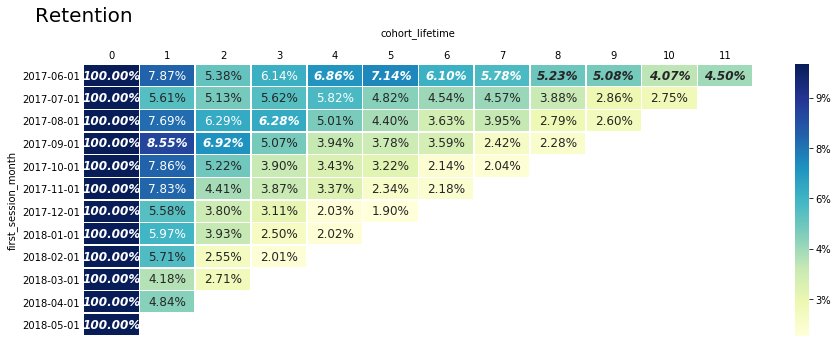

In [18]:
bokeh_visits_count_plot(visits, orders_df=orders, costs_df=costs,
                        common_datetime_column='session_start',
                        day_column='session_umd', 
                        week_column='session_week',
                        month_column='session_month',
                        orders_column='date_of_purchase',
                        count_column='uid',
                        revenue_column='revenue',
                        costs_groupby_column='date',
                        costs_column='costs',
                        session_duration_column='session_duration',
                        show_ret_heatmap=True, 
                        tabs_to_show=[1,2,3,4], active_tab=0,
                        plot_width=840, 
                        plot_height=500)

<a name="2.3."></a><br/>
<b>2.3. Выводы:</b>.<br/>
<font size="2">([к содержанию](#0.0))</font><br/>

* <font size="4"><b>1.1. Сколько людей пользуются нашим ресурсом в день, неделю, месяц?</b></font>.<br/>
<b>DAU: 908</b> пользователей<br/>
<b>WAU: 5722</b> пользователя<br/>
<b>MAU: 23228</b> пользователей<br/>


* <font size="4"><b>1.2. Сколько сессий в день?</b></font>.<br/>
<b>Daily visits avg</b>: 987<br/>
Это значит, что в среднем каждый пользователь заходит на ресурс лишь 1 раз в день.<br/><br/>

* <font size="4"><b>1.3. Сколько длится одна сессия?</b></font>.<br/>
<b>Продолжительность большей части сессий</b> - от 0 до 2 минут. Фактически, пользователи заходят на сайт и сразу с него уходят.<br/><br/>

* <font size="4"><b>1.4. Как часто люди возвращаются?</b></font>.<br/>
Необходимо отметить, что <b>Retention</b> довольно низкий. <b>Retention</b> второго месяца пользования нашим ресурсом находится в интервале <b>от 6 до 8,5%</b> в зависимости от когорты.Причем после одного месяца пользователя, на второй, возвращается большая часть клиентов, далее, с течением времени, этот процент падает до <b>2,5-3%</b>.<br/>
Это справедливо для всех, кроме самой первой когорты, которая начала пользоваться ресурсом в июне 2017 года. Их <b>Retention</b> тоже довольно низкий, но постоянно находится в "лидерах" по сравнении со всеми остальными когортами.<br/><br/>
Чем же эта первая когорта так особенна? - На этот вопрос необходимо искать ответ.<br/><br/>

Помимо этого на графиках (особенно сильно это заметно на графиках <b>DAU</b> и <b>Session duration</b>) есть необычные всплески активности и, наоборот, провалы. Проанализируем их далее.

* <font size="4"><b>1.5. Информация о выручке, затратах, количеству заказов и среднему чеку</b></font>.<br/>

Выведем наш график ещё раз (уже без heatmap'a и лишних вкладок):

In [19]:
bokeh_visits_count_plot(visits, orders_df=orders, costs_df=costs,
                        common_datetime_column='session_start',
                        day_column='session_umd', 
                        week_column='session_week',
                        month_column='session_month',
                        orders_column='date_of_purchase',
                        count_column='uid',
                        revenue_column='revenue',
                        costs_groupby_column='date',
                        costs_column='costs',
                        session_duration_column='session_duration',
                        show_ret_heatmap=False, 
                        tabs_to_show=[7,5,6,1], active_tab=0,
                        plot_width=840, 
                        plot_height=500)

Мы имеем данные (в порядке следования графиков) <b>по прибыли; выручке и затратам; количеству заказов и среднему чеку; дневному количеству посетителей</b>.<br/><br/>

<font size="4"><b>Прибыль</b> (вкладка <b>Profit</b>).</font><br/>
  Большая часть графика лежит ниже "0", т.е. компания несет убытки. Средний показатель прибыли в день - <b>-212 т.р.</b> Фактически, это убытки.<br/>
  Этот показатель будет как третейский судья при последующем анализе качества купленной рекламы и оценке успешности рекламной кампании.<br/><br/>
  
<font size="4"><b>Выручка и затраты</b> (вкладка <b>Revenue and costs</b>).</font><br/>
  Расширенная версия графика с прибылью. Здесь мы можем в подробностях посмотреть на значения и выручки, и затрат на рекламу, чтобы понять, как образовалась прибыль каждого из дней. На графике одновременно мы можем отразить показатели выручки, затрат и средней стоимости 1 заказа (для оперативного понимания, что имело большее влияние на конечную выручку - количество заказов или средний чек.<br/><br/>
  
<font size="4"><b>Количество заказов, средний чек</b> (вкладка <b>Orders count, avg check</b>).</font><br/>
  Пронаблюдаем за тем, как изменялся показатель количества совершенных за каждый день заказов. Также можем вывести средний чек.<br/><br/>
  
<font size="4"><b>Количество пользователей за день (и суммарное количество визитов)</b> (вкладка <b>DAU + daily visits</b>).</font><br/>
  Посмотрим, как росла/падала посещаемость сайта, и как это коррелировало с изменением затрат на рекламу.<br/><br/>
  
Определим события для рассмотрения (аномальные точки) каждого из графиков и исследуем данные:

<hr />
<html>
<head>
    <title>Title of the document</title>
    <style>
      table, th, td {
      padding: 10px;
      border: 1px solid black; 
      border-collapse: collapse;
      }
    </style>
  </head>
<body>
<table border="1" cellspacing="0" cellpadding="0">
<tr>
<td><b>Дата события</b></td>
<td><b>Выручка, т.р.</b></td>
<td><b>Затраты, т.р.</b></td>
<td><b>Прибыль, т.р.</b></td>
<td><b>Средний чек, т.р.</b></td>
<td><b>Заказы, шт.</b></td>
<td><b>Кол-во уник. пользователей, чел.</b></td>
<td><b>Вывод</b></td>   
</tr>
<tr>
<td> <b>8 июня 2017г.</b></td>
<td>444<span style="color:green">&#x2796;</span></td>
<td>1354<span style="color:red">&#x25B2;</span></td>
<td><font color=red><b>-910</b></font></td>
<td>2<span>&#x2796;</span></td>
<td>181<span style="color:green">&#x25B2;</span></td>
<td>868<span style="color:green">&#x25B2;</span></td>
<td><font size="3">Реклама позволила увеличить количество заказов, но этого было недостаточно, чтобы серьезно увеличить прибыль, т.к. средний чек был довольно низкий.</font></td>
</tr>
<tr>
<td> <b>14 июля 2017г.</b></td>
<td>737<span style="color:green">&#x2796;</span></td>
<td>1328<span style="color:red">&#x25B2;</span></td>
<td><font color=red><b>-591</b></font></td>
<td>5<span>&#x2796;</span></td>
<td>138<span>&#x2796;</span></td>
<td>839<span style="color:green">&#x25B2;</span></td>
<td><font size="3">Эффект от рекламы не принес ожидаемого эффекта. Поток посетителей вырос, но покупать больше они не стали.</font></td>
</tr>
<tr>
<td> <b>17 июля 2017г.</b></td>
<td>1759<span style="color:green">&#x25B2;</span></td>
<td>1155<span style="color:red">&#x25B2;</span></td>
<td><font color=green><b>604</b></font></td>
<td>8<span>&#x25B2;</span> </td>
<td>225<span>&#x25B2;</span> </td>
<td>1138<span style="color:green">&#x25B2;</span></td>
<td><font size="3">Реклама была успешная. Выручка выросла засчет увеличения потока посетителей, и, как следствие, количества заказов и величины среднего чека.</font></td>
</tr>
<tr>
<td> <b>6 октября 2017г.</b></td>
<td>1350<span style="color:green">&#x2796;</span></td>
<td>1758<span style="color:red">&#x25B2;</span></td>
<td><font color=red><b>-408</b></font></td>
<td>4<span>&#x25BC;</span> </td>
<td>371<span>&#x25B2;</span> </td>
<td>1418<span style="color:green">&#x25B2;</span></td>
<td><font size="3">Реклама увеличила количество заказов, но средний чек был низкий, поэтому ушли в "минус". Предполагаю, что продавались билеты на какие-то некрупные мероприятия, но необходимо было их продать большее количество, а мероприятие(-я) не вызвало(-и) особого ажиотажа.</font></td>
</tr>
<tr>
<td> <b>27 октября 2017г.</b></td>
<td>893<span style="color:red">&#x25BC;</span></td>
<td>1739<span style="color:red">&#x25B2;</span></td>
<td><font color=red><b>-846</b></font></td>
<td>5<span>&#x2796;</span></td>
<td>188<span>&#x2796;</span></td>
<td>1187<span style="color:green">&#x2796;</span></td>
<td><font size="3">Рекламная кампания вообще не изменила положение дел ни по среднему количеству заказов, ни по среднему чеку.</font></td>
</tr>
<tr>
<td> <b>16 ноября 2017г.</b></td>
<td>1916<span style="color:green">&#x25B2;</span></td>
<td>1811<span style="color:red">&#x25B2;</span></td>
<td><font color=green><b>105</b></font></td>
<td>8<span>&#x25B2;</span>  </td>
<td>254<span>&#x25B2;</span>  </td>
<td>1604<span style="color:green">&#x25B2;</span></td>
<td><font size="3">Небольшая, но при этом успешная рекламная кампания.</font></td>
</tr>
<tr>
<td> <b>24 ноября 2017г.</b></td>
<td>3398<span style="color:green">&#x25B2;</span><span style="color:green">&#x25B2;</span></td>
<td>3459<span style="color:red">&#x25B2;</span><span style="color:red">&#x25B2;</span></td>
<td><font color=red><b>-61</b></font></td>
<td>4<span>&#x2796;</span></td>
<td>814<span>&#x25B2;</span><span>&#x25B2;</span></td>
<td>3319<span style="color:green">&#x25B2;</span><span style="color:green">&#x25B2;</span></td>
<td><font size="3">Самая крупные вложения в рекламы за весь годовой период. В несколько раз увеличили количество заказов, реклама вышла в "ноль" по части финансов.</font></td>
</tr>
<tr>
<td> <b>10 декабря 2017г.</b></td>
<td>4661<span style="color:green">&#x25B2;</span></td>
<td>1071<span style="color:green">&#x2796;</span></td>
<td><font color=green><b>3590</b></font></td>
<td>29<span>&#x25B2;</span><span>&#x25B2;</span></td>
<td>160<span>&#x2796;</span></td>
<td>1130<span style="color:red">&#x25BC;</span></td>
<td><font size="3">Самая успешный день для компании в этом году. Средняя величина затрат (по сравнению с соседними периодами) не изменилась, т.е., фактически, никаких агрессивных вложений в рекламу не производилось, однако выручка выросла очень сильно. А сумма среднего чека поднялась почти в 6 раз относительно средних 5 т.р. Предполагаю, что приехала какая-то мировая бэнд-группа и билеты скупали не по одному, именно поэтому такая средняя сумма по чеку.</font></td>
</tr>
<tr>
<td> <b>11 декабря 2017г.</b></td>
<td>1018<span style="color:red">&#x25BC;</span></td>
<td>2121<span style="color:red">&#x25B2;</span></td>
<td><font color=red><b>-1103</b></font></td>
<td>5<span>&#x2796;</span></td>
<td>209<span>&#x2796;</span></td>
<td>1505<span style="color:green">&#x25B2;</span></td>
<td><font size="3">Были произведены вложения в рекламу сразу же после успешного дня, видимо, на фоне успеха, и это обошлось для компании финансовыми потерями, т.к. никакого эффекта по части продаж эта кампания не возымела.</font></td>
</tr>
<tr>
<td> <b>10 февраля 2018г.</b></td>
<td>1071<span style="color:red">&#x25BC;</span></td>
<td>1981<span style="color:red">&#x25B2;</span></td>
<td><font color=red><b>-910</b></font></td>
<td>4<span>&#x2796;</span></td>
<td>244<span>&#x2796;</span></td>
<td>1189<span style="color:green">&#x2796;</span></td>
<td><font size="3">"Средняя" по вложениям рекламная кампания, без должного эффекта, в убытки.</font></td>
</tr>
<tr>
<td> <b>30-31 марта 2018г.</b></td>
<td>50<span style="color:red">&#x25BC;</span><span style="color:red">&#x25BC;</span></td>
<td>15<span style="color:green">&#x25BC;</span><span style="color:green">&#x25BC;</span></td>
<td>35</td>
<td>2<span>&#x25BC;</span> </td>
<td>8<span>&#x25BC;</span><span>&#x25BC;</span> </td>
<td>60<span style="color:red">&#x25BC;</span><span style="color:red">&#x25BC;</span></td>
<td><font size="3">Все показатели резко упали. Предполагаю, что в течение 1 (или чуть более) дня ресурс был недоступен для пользователей или же "слетели" все метки, отслеживающие изменение тех или иных показателей. Необходимо выяснять у технической службы.</font></td>
</tr>
<tr>
<td> <b>31 мая 2018г.</b></td>
<td>4614<span style="color:green">&#x25B2;</span></td>
<td>2154<span style="color:red">&#x25B2;</span></td>
<td><font color=green><b>2460</b></font></td>
<td>8<span>&#x25B2;</span></td>
<td>610<span>&#x25B2;</span><span>&#x25B2;</span></td>
<td>1997<span style="color:green">&#x25B2;</span></td>
<td><font size="3">Вторая особо успешная рекламная компания. Вложения приличные, но при этом окупились с запасом. Средний чек и количество заказов серьезно выросли в этот день, что позволило сделать хорошую выручку.</font></td>
</tr>
</table>
</body>
</html>
<hr />

Исследования произведены точечно. Они могут не описывать всей картины, т.к. эффект от рекламы, обычно, длится не 1 день и не всегда цель рекламной кампании - сделать выручку в этот день. Иногда она делается для привлечения пользователей, особенно, если ресурс достаточно новый.<br/><br/>
<b>Тем не менее, по результатам рекламных кампаний необходимо провести переговоры с маркетологами, так как далеко не каждое вложение в определенный рекламный канал оказывалось успешным. Про период 30-31 марта необходимо уточнить у технической службы, что послужило поводом для таких резким спадам по всем показателям.</b><br/><br/>

Далее мы вернемся к вопросу маркетинга <font size="2">([перейти к маркетингу](#4.))</font> и разберем, как соотносятся между собой выручка и затраты и какой рекламный канал оказался эффективней других и какие есть проблемы по каждому из рекламных каналов.

<a name="2.4."></a><br/>
<b>2.4. Retention Heatmap (с относительными и абсолютными величинами)</b>:<br/>
<font size="2">([к содержанию](#0.0))</font><br/>

Для интереса, посмотрим на <b>heatmap Retention</b> с отображением одновременно и относительных, и абсолютных величин (в % и в количестве "оставшихся" из когорты пользователей):

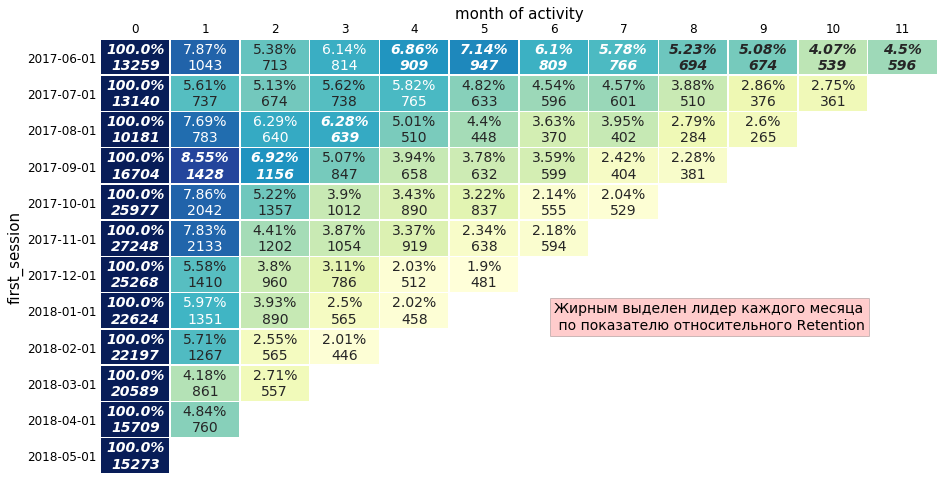

In [20]:
# получаем pivot'ы относительного и абсолютно Retention 

df_ret_prepare = visits.copy()
first_session_date = df_ret_prepare.groupby('uid')['session_start'].min()
first_session_date.name = 'first_session_month'
df_ret_prepare = df_ret_prepare.join(first_session_date,on='uid')
df_ret_prepare['first_session_month'] = df_ret_prepare['first_session_month'].astype('datetime64[M]')
df_ret_prepare['session_month'] = df_ret_prepare['session_start'].astype('datetime64[M]')
df_ret_prepare['cohort_lifetime'] = df_ret_prepare['session_month'] - df_ret_prepare['first_session_month']
df_ret_prepare['cohort_lifetime'] = df_ret_prepare['cohort_lifetime'] / np.timedelta64(1,'M')
df_ret_prepare['cohort_lifetime'] = df_ret_prepare['cohort_lifetime'].round().astype('int')

cohorts_ret = (df_ret_prepare
                       .groupby(['first_session_month', 'cohort_lifetime'])
                       .agg({'uid': 'nunique'})
                       .reset_index()
          )

init_users_count = cohorts_ret[cohorts_ret['cohort_lifetime']==0][['first_session_month', 'uid']]
init_users_count = init_users_count.rename(columns={'uid': 'cohort_users'})

cohorts_ret = cohorts_ret.merge(init_users_count, on='first_session_month')
cohorts_ret['retention'] = cohorts_ret['uid']/cohorts_ret['cohort_users']

retention_pivot_abs = cohorts_ret.pivot_table(index='first_session_month', columns='cohort_lifetime',
                                      values='uid', aggfunc='sum')
retention_pivot_rel = cohorts_ret.pivot_table(index='first_session_month', columns='cohort_lifetime',
                                      values='retention', aggfunc='sum')
retention_pivot_rel = (retention_pivot_rel * 100).round(2)

# создаем датафрейм, где в каждой ячейке фигурируют оба значения
df_retention_rel_abs = pd.DataFrame(index=retention_pivot_rel.index, columns=retention_pivot_rel.columns) 

for col in retention_pivot_rel.columns:
    first_part = retention_pivot_rel[col].astype('str') + '%' + '\n'
    second_part = retention_pivot_abs[col].astype('str').str.rstrip('0').str.rstrip('.')
    df_retention_rel_abs[col] = first_part + second_part
df_retention_rel_abs = df_retention_rel_abs.replace('nan%\nnan', '')

# строим heatmap
max_in_each_column_ret = np.max(retention_pivot_rel, axis=0)

plt.figure(figsize=(15,8))
# string_rel = ltv_pivot_revenue.values
# string_uid = retention_pivot_abs.values

heatmap_retention_rel_abs = sns.heatmap(retention_pivot_rel, fmt='', annot=df_retention_rel_abs.values, 
                                        cmap='YlGnBu', linewidths=.5,
                                        mask=retention_pivot_rel == max_in_each_column_ret, cbar=False, vmax=10,
                                        annot_kws={"size": 14})


heatmap_retention_rel_abs = sns.heatmap(retention_pivot_rel, fmt='', annot=df_retention_rel_abs.values, 
                                        cmap='YlGnBu', linewidths=.5,
                                        mask=retention_pivot_rel != max_in_each_column_ret,
                                        annot_kws={"style": "italic", "weight": "bold", "size": 14}, vmax=10,
                                        cbar=False)

y_labels_ret = heatmap_retention_rel_abs.set_yticklabels(retention_pivot_rel.index.date)
heatmap_retention_rel_abs.set_xlabel('month of activity', fontsize=15)
heatmap_retention_rel_abs.set_ylabel('first_session', fontsize=15)
heatmap_retention_rel_abs.tick_params(length=0)
heatmap_retention_rel_abs.set_xticklabels(heatmap_retention_rel_abs.get_xmajorticklabels(), fontsize = 12)
heatmap_retention_rel_abs.set_yticklabels(heatmap_retention_rel_abs.get_ymajorticklabels(), fontsize = 12)
heatmap_retention_rel_abs.xaxis.tick_top()
heatmap_retention_rel_abs.xaxis.set_label_position('top')
text_ret = plt.text(6.5, 8, 'Жирным выделен лидер каждого месяца\n по показателю относительного Retention',
                bbox=dict(facecolor='red', alpha=0.2),
                fontsize=14)

Здесь мы можем отметить, что начиная с октября средняя численность когорты серьезно возросла - с ~13000 человек до 20000+ человек. Необходимо проанализировать и уточнить, что сыграло главную роль в таком резком увеличении посещаемости сайта. <b>Retention</b> по этим более численным когортам немного ниже, чем у первых трех, тем не менее, по абсолютному показателю мы имеем практически в 2 раза больше пользователей, продолжающих пользоваться нашим ресурсом по сравнению с первыми когортами (кроме первой, которая является аномально активной и "постоянной" на фоне остальных).

<hr style="border: 1px solid #000;">

<a name="3."></a><br/>
<font size="5"><b>3. Анализ данных по продажам</b></font>.<br/>
<font size="2">([к содержанию](#0.0))</font><br/>
* 3.1. Когда люди начинают покупать?
* 3.2. Сколько раз покупают за период?
* 3.3. Какой средний чек?
* 3.4. Сколько денег приносят? (LTV)

<br/>
Работать будем с датафреймами <b>orders</b> и <b>visits</b>.

<a name="3.1."></a><br/>
<b>3.1. Когда люди начинают покупать?</b>.<br/>
<font size="2">([к содержанию](#0.0))</font><br/>

Подготовим данные.

Сгруппируем датафрейм <b>orders</b> по пользователям, чтобы найти дату их первого заказа, и датафрейм <b>visits</b>, чтобы найти дату первой сессии:

In [21]:
first_purchase_date = orders.groupby('uid')[['date_of_purchase']].min().reset_index()
first_purchase_date.columns = ['uid', 'first_purchase_date']
first_session_date = visits.groupby('uid')[['session_start']].min().reset_index()
first_session_date.columns = ['uid', 'first_session']

Сведем данные в общим датафрейм:

In [22]:
when_they_buy = first_purchase_date.merge(first_session_date, on='uid')

In [23]:
when_they_buy.head()

,uid,first_purchase_date,first_session
0,313578113262317,2018-01-03 21:51:00,2017-09-18 22:49:00
1,1575281904278712,2017-06-03 10:13:00,2017-06-03 10:13:00
2,2429014661409475,2017-10-11 18:33:00,2017-10-11 17:14:00
3,2464366381792757,2018-01-28 15:54:00,2018-01-27 20:10:00
4,2551852515556206,2017-11-24 10:14:00,2017-11-24 10:14:00


Добавим столбец с разницей в минутах между датой и временем первого заказа и датой и временем первой сессии:

In [24]:
when_they_buy['buy_diff'] = when_they_buy['first_purchase_date'] - when_they_buy['first_session']
when_they_buy['buy_diff'] = when_they_buy['buy_diff']/np.timedelta64(1, 'm')
when_they_buy['buy_diff'] = when_they_buy['buy_diff'].round(1)
when_they_buy.head(10)

,uid,first_purchase_date,first_session,buy_diff
0,313578113262317,2018-01-03 21:51:00,2017-09-18 22:49:00,154022.0
1,1575281904278712,2017-06-03 10:13:00,2017-06-03 10:13:00,0.0
2,2429014661409475,2017-10-11 18:33:00,2017-10-11 17:14:00,79.0
3,2464366381792757,2018-01-28 15:54:00,2018-01-27 20:10:00,1184.0
4,2551852515556206,2017-11-24 10:14:00,2017-11-24 10:14:00,0.0
5,3077748354309989,2018-03-03 12:33:00,2018-03-03 12:08:00,25.0
6,3605148382144603,2017-09-21 20:56:00,2017-08-15 21:54:00,53222.0
7,3753586865891862,2018-03-03 13:50:00,2018-03-03 13:47:00,3.0
8,4808417689019433,2018-01-09 23:32:00,2018-01-09 23:10:00,22.0
9,4992223027560440,2018-04-04 13:54:00,2018-04-04 13:54:00,0.0


Сгруппируем датафрейм по пользователям и по каждому из них выберем минимальную разницу по времени (т.е. разницу между первой сессией и первой покупкой):

In [25]:
to_hist = when_they_buy.groupby('uid')[['buy_diff']].min()

Посмотрим на выбросы и построим гистограмму:

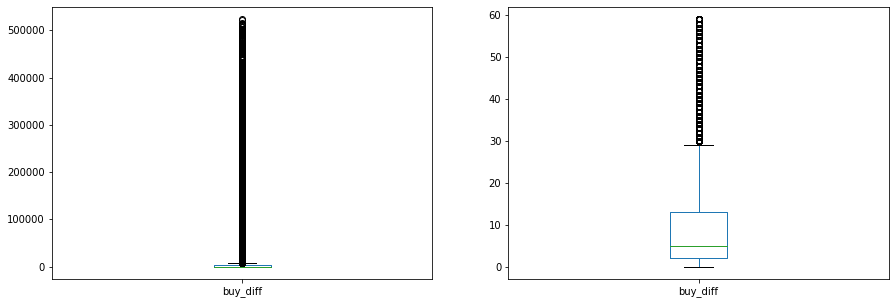

In [26]:
fig, axes = plt.subplots(1,2, figsize=(15,5))

to_hist.plot(kind='box', ax=axes[0])
to_hist.query('buy_diff < 60').plot(kind='box', ax=axes[1])

Выбросы начинаются с разницы по времени от 30 минут и более.<br/><br/>
На основании этих данных построим гистограмму распределения этой разницы по времени:

In [27]:
import pandas_bokeh
pandas_bokeh.output_notebook()

Loading BokehJS ...

In [28]:
title = "Гистограмма распределения разницы между временем первого заказа и началом первой сессии"

first_order_hist = to_hist.query('buy_diff <= 30').plot_bokeh.hist(
                                bins=30,
                                xlim=(0, 30),
                                ylim=(0,3000),
                                title=title,
                                legend=False,
                                color="#83C2BA",
                                sizing_mode="scale_width",
                                line_color="black")

<b>Вывод</b>: у большей части пользователей на оформление заказа уходит не более 3 минут. Т.е. они заходят ресурс и сразу делают заказ. Видно, что заходят они сразу по делу, а не посидеть поискать что-либо интересное.<br/><br/>

Теперь посмотрим, как часто пользователи совершают покупки и на средний чек.

<a name="3.2."></a><br/>
<b>3.2. Сколько раз покупают за период?</b>.<br/>
<font size="2">([к содержанию](#0.0))</font><br/>

За период возьмем месяц. Посмотрим, сколько каждый пользователь делает покупок за "свой" месяц.

In [29]:
orders.head()

,date_of_purchase,revenue,uid
0,2017-06-01 00:10:00,17.00,10329302124590727494
1,2017-06-01 00:25:00,0.55,11627257723692907447
2,2017-06-01 00:27:00,0.37,17903680561304213844
3,2017-06-01 00:29:00,0.55,16109239769442553005
4,2017-06-01 07:58:00,0.37,14200605875248379450


Сгруппируем по пользователям и найдем у каждого время первого заказа:

In [30]:
df_purchases_by_month = orders.copy()
first_purchase = df_purchases_by_month.groupby('uid')['date_of_purchase'].min().reset_index()
first_purchase.columns = ['uid', 'date_of_first_purchase']
order_frequency = pd.merge(df_purchases_by_month, first_purchase, on='uid')
order_frequency.head(10)

,date_of_purchase,revenue,uid,date_of_first_purchase
0,2017-06-01 00:10:00,17.00,10329302124590727494,2017-06-01 00:10:00
1,2017-06-01 00:25:00,0.55,11627257723692907447,2017-06-01 00:25:00
2,2017-06-01 00:27:00,0.37,17903680561304213844,2017-06-01 00:27:00
3,2017-06-01 00:29:00,0.55,16109239769442553005,2017-06-01 00:29:00
4,2017-06-01 07:58:00,0.37,14200605875248379450,2017-06-01 07:58:00
5,2017-06-01 08:43:00,0.18,10402394430196413321,2017-06-01 08:43:00
6,2017-06-01 08:54:00,1.83,12464626743129688638,2017-06-01 08:54:00
7,2017-06-05 14:30:00,7.33,12464626743129688638,2017-06-01 08:54:00
8,2017-06-01 09:22:00,1.22,3644482766749211722,2017-06-01 09:22:00
9,2017-06-02 12:44:00,0.85,3644482766749211722,2017-06-01 09:22:00


Теперь добавим столбец <b>time_difference</b>, где будет в месяцах указано время "пребывания" каждого пользователя с момента первого визита на момент конкретного заказа:

In [31]:
def diff_month(row):
    date1 = row['date_of_purchase']
    date2 = row['date_of_first_purchase']
    return (date1.year - date2.year) * 12 + date1.month - date2.month

order_frequency['time_difference'] = order_frequency.apply(diff_month, axis=1)
order_frequency['date_of_first_purchase'] = order_frequency['date_of_first_purchase'].astype('datetime64[M]')
order_frequency.head(10)

,date_of_purchase,revenue,uid,date_of_first_purchase,time_difference
0,2017-06-01 00:10:00,17.00,10329302124590727494,2017-06-01,0
1,2017-06-01 00:25:00,0.55,11627257723692907447,2017-06-01,0
2,2017-06-01 00:27:00,0.37,17903680561304213844,2017-06-01,0
3,2017-06-01 00:29:00,0.55,16109239769442553005,2017-06-01,0
4,2017-06-01 07:58:00,0.37,14200605875248379450,2017-06-01,0
5,2017-06-01 08:43:00,0.18,10402394430196413321,2017-06-01,0
6,2017-06-01 08:54:00,1.83,12464626743129688638,2017-06-01,0
7,2017-06-05 14:30:00,7.33,12464626743129688638,2017-06-01,0
8,2017-06-01 09:22:00,1.22,3644482766749211722,2017-06-01,0
9,2017-06-02 12:44:00,0.85,3644482766749211722,2017-06-01,0


Выделим когорты по первой сессии и по месяцам и посчитаем количество заказов за данный конкретный месяц, количество уникальных пользователей и количество заказов на одного пользователя:

In [32]:
purchases_grouped_by_cohorts = (order_frequency
                                                .groupby(['date_of_first_purchase','time_difference'])
                                                .agg({'date_of_purchase': 'count', 'uid': 'nunique'})
                               )

purchases_grouped_by_cohorts['purchases_per_player'] = purchases_grouped_by_cohorts['date_of_purchase']/purchases_grouped_by_cohorts['uid']
purchases_grouped_by_cohorts = purchases_grouped_by_cohorts.reset_index()
purchases_grouped_by_cohorts.head()

,date_of_first_purchase,time_difference,date_of_purchase,uid,purchases_per_player
0,2017-06-01,0,2354,2023,1.163618
1,2017-06-01,1,177,61,2.901639
2,2017-06-01,2,174,50,3.480000
3,2017-06-01,3,226,54,4.185185
4,2017-06-01,4,292,88,3.318182


Сгруппируем данные:

In [33]:
purchase_pivot = purchases_grouped_by_cohorts.pivot_table(index='date_of_first_purchase', 
                                                          columns='time_difference', 
                                                          values='purchases_per_player')

In [34]:
purchase_pivot

time_difference,0,1,2,3,4,5,6,7,8,9,10,11
date_of_first_purchase,,,,,,,,,,,,
2017-06-01,1.163618,2.901639,3.480000,4.185185,3.318182,3.253731,4.451613,3.702128,3.655172,3.400000,2.133333,1.622642
2017-07-01,1.136765,1.923077,2.105263,1.625000,1.469388,2.157895,1.694444,1.282051,1.380952,1.090909,2.038462,NaN
2017-08-01,1.118978,1.862069,1.886792,1.840909,2.125000,1.937500,1.633333,1.772727,2.421053,1.483871,NaN,NaN
2017-09-01,1.136381,1.684615,1.610000,2.216216,1.288462,1.703125,1.636364,1.513514,1.418605,NaN,NaN,NaN
2017-10-01,1.143779,1.524272,1.317073,1.326087,1.387097,1.430556,1.535714,1.865672,NaN,NaN,NaN,NaN
2017-11-01,1.179368,1.788288,1.516667,1.990566,1.679012,1.229167,1.645161,NaN,NaN,NaN,NaN,NaN
2017-12-01,1.152635,1.849315,1.961165,1.845361,1.720000,1.666667,NaN,NaN,NaN,NaN,NaN,NaN
2018-01-01,1.121554,1.964912,1.915663,1.488372,1.733333,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2018-02-01,1.121611,1.881356,1.431034,1.794872,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


Отобразим <b>heatmap</b> для этого pivot'a. Для этого напишем функцию, дальше она нам ещё пригодится:

In [35]:
def plot_heatmap(pivot_table, vmax=3, title='Heatmap', figsize=(15,6), annot_font_size=13, 
                 round_val=None, fmt='.2f',
                 xlabel_text='Время использования ресурса (мес.)',
                 ylabel_text='Начало использования ресурса'):
    pivot_table_copy = pivot_table.copy()
    if round_val is not None:
        fmt='.{}f'.format(round_val)
            
    pivot_table_copy.loc[''] = np.nan
    pivot_table_copy.loc['Average'] = pivot_table_copy[:-1].mean(axis=0)
    pivot_table_copy.loc['Average'][0] += 0.1
    
    from matplotlib.colors import ListedColormap

    max_mean = pivot_table_copy.loc['Average'].max()
    max_in_each_column = np.max(pivot_table_copy[:-2], axis=0)
    max_in_each_column.iloc[-1] += 5
    plt.figure(figsize=figsize)

    y_labels_list = list()
    for i in pivot_table_copy.index[:-2]:
        y_labels_list.append(str(i.date().year) + '-' + ['', '0'][i.date().month < 10] + 
                             str(i.date().month) + '-' + '0' +
                             str(i.date().day))
    
    y_labels_list.append('')
    y_labels_list.append('Average')

    # общая
    heatmap = sns.heatmap(pivot_table_copy, fmt=fmt, annot=True, cmap=ListedColormap(['white']), 
                          vmax=vmax, linewidths=.5, cbar=False,
                          mask=((pivot_table_copy == max_mean) | (pivot_table_copy == max_in_each_column)),
                          annot_kws={"size": annot_font_size})


    # нежирные
    heatmap = sns.heatmap(pivot_table_copy[:-2], fmt=fmt, annot=True, cmap='YlGnBu', vmax=vmax, linewidths=.5,
                      mask=pivot_table_copy[:-2] == max_in_each_column, 
                      annot_kws={"size": annot_font_size})


    heatmap.xaxis.labelpad = 15
    heatmap.tick_params(length=0)

    # жирные
    heatmap = sns.heatmap(pivot_table_copy[:-2], fmt=fmt, annot=True, cmap='YlGnBu', vmax=vmax, linewidths=.5,
                          mask=pivot_table_copy[:-2] != max_in_each_column,
                          annot_kws={"weight": "bold", "size": annot_font_size},
                          cbar=False)

    # жирным общее максимальное
    heatmap = sns.heatmap(pivot_table_copy, fmt=fmt, annot=True, cmap=ListedColormap(['white']), 
                          vmax=vmax, linewidths=.5, cbar=False,
                          mask=pivot_table_copy != max_mean,
                          annot_kws={"weight": "bold", "size": annot_font_size})
    heatmap.tick_params(axis="x", bottom=True, top=True, labelbottom=True, labeltop=True)

    heatmap.xaxis.set_label_position('top')
    heatmap.xaxis.labelpad = 15
    heatmap.yaxis.set_label_coords(-0.13, 0.57)
    y_labels = heatmap.set_yticklabels(y_labels_list)
    heatmap.tick_params(length=0)
    title = plt.title(title, x=0.0, fontsize=20)
    heatmap.set_xlabel(xlabel_text, fontsize=12)
    heatmap.set_ylabel(ylabel_text, fontsize=12)
    mean_value = pivot_table_copy.loc['Average'].mean()

Отрисуем <b>Heatmap</b> частоты покупок по когортам:

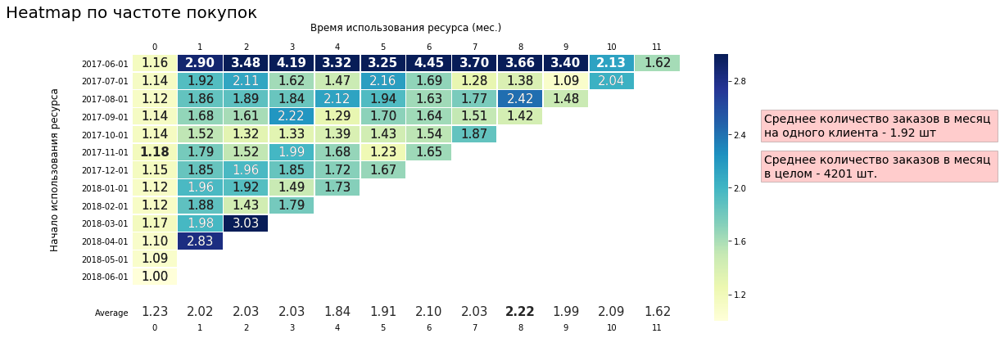

In [36]:
plot_heatmap(purchase_pivot, vmax=3, title='Heatmap по частоте покупок',
             annot_font_size=15,
             xlabel_text='Время использования ресурса (мес.)',
             ylabel_text='Начало использования ресурса')
mean_value = purchase_pivot.mean().mean()
purchase_count_mean_revenue = order_frequency['revenue'].count() / 12
order_mean_revenue = order_frequency['revenue'].mean()
text = plt.text(0.84, 0.65, 'Среднее количество заказов в месяц \nна одного клиента - {:.2f} шт'.
                format(mean_value),
                bbox=dict(facecolor='red', alpha=0.2),
                fontsize=14, transform=plt.gcf().transFigure)
text = plt.text(0.84, 0.535, 'Среднее количество заказов в месяц \nв целом - {:.0f} шт.'.
                format(purchase_count_mean_revenue),
                bbox=dict(facecolor='red', alpha=0.2),
                fontsize=14, transform=plt.gcf().transFigure)

Опять первая когорта, у которых <b>Retention</b> выше, чем у всех остальных когорт, в лидерах - в среднем эта когорта делает более 3 заказов в месяц.<br/><br/>
Первый месяц все пользователи присматриваются к сервису, а далее уже "разгоняются" и в среднем делают около 2 заказов в месяц.<br/><br/>
Апрельская когорта на второй месяц использования ресурса выделилась - практически 3 покупки на клиента, в сравнении с остальными когортами, где, в большинстве, не дотягивает даже до значения в 2 покупки, это выглядит довольно странно, как и показатель "3" у мартовской когорты. Необходимо изучать.

<a name="3.3."></a><br/>
<b>3.3. Какой средний чек?</b>.<br/>
<font size="2">([к содержанию](#0.0))</font><br/>

Теперь узнаем, какой был средний чек по каждой когорте по месяцам:

In [37]:
orders_check = orders.copy()

orders_check['date_of_purchase'] = orders_check['date_of_purchase'].astype('datetime64[M]')

first_orders_month = orders_check.groupby('uid').agg({'date_of_purchase': 'min'}).reset_index()
first_orders_month.columns = ['uid', 'first_purchase_date']

cohort_sizes = first_orders_month.groupby('first_purchase_date').agg({'uid': 'nunique'}).reset_index()
cohort_sizes.columns = ['first_purchase_date', 'n_buyers']

orders_first_orders_month = orders_check.merge(first_orders_month, on='uid')
cohorts = (orders_first_orders_month
                                    .groupby(['date_of_purchase', 'first_purchase_date'])
                                    .agg({'revenue': 'median'})
                                    .reset_index()
          )
mean_check = cohorts.merge(cohort_sizes, on='first_purchase_date')
time_diff = mean_check['date_of_purchase'] - mean_check['first_purchase_date']
mean_check['age'] = time_diff / np.timedelta64(1, 'M')
mean_check['age'] = mean_check['age'].round().astype('int')
mean_check_pivot = mean_check.pivot_table(index="first_purchase_date", columns="age", values="revenue")

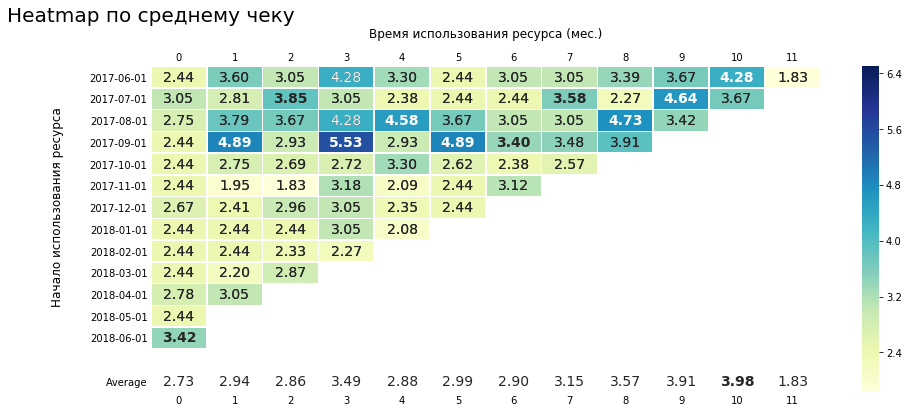

In [38]:
plot_heatmap(mean_check_pivot, vmax=6.5, title='Heatmap по среднему чеку',
             annot_font_size=14,
             xlabel_text='Время использования ресурса (мес.)',
             ylabel_text='Начало использования ресурса')

Средний (медианный) чек равен примерно 3 т.р. Однако можно заметить, что средний чек первых 4х когорт в среднем выше, чем средний чек всех остальных. Это те пользователи, которые имеют более высокий <b>Retention</b> - то есть мало того, что они остаются, они ещё и совершают заказы на в среднем большую сумму.

Необходимо более подробно исследовать деятельность клиентов из этих когорт и как они пользовались сервисом, это может нам дать подсказку, как работать в этом направлении в отношении менее активных когорт, которые не готовы так тратить деньги.

<a name="3.4."></a><br/>
<b>3.4. Сколько денег приносит в среднем один пользователь? (LTV при margin_rate = 0.5 и 1)</b>.<br/>
<font size="2">([к содержанию](#0.0))</font><br/>

Рассчитаем <b>LTV</b>.<br/><br/>
Посмотрим на <b>LTV</b> при коэффициенте маржинальности равным и 0.5, и 1 (хотя, с моей точки зрения, вариант со значением коэффициента маржинальности, равному 1, нереален, учитывая то, что <b>Яндекс.Афиша</b> в продаже билетов явно выступает посредником между исполнителем и клиентом, но в связи с тем, что этот показатель заранее не определен в задании, исследуем таких два варианта):

Напишем функцию для получения сводной таблицы по <b>LTV</b> при заданном <b>margin_rate</b>: 

In [39]:
# функция для получения сводной таблицы LTV в зависимости от margin_rate

def get_LTV_pivot(margin_rate=0.5):
    prepare_ltv = orders.copy()

    prepare_ltv['date_of_purchase'] = prepare_ltv['date_of_purchase'].astype('datetime64[M]')

    first_orders_month = prepare_ltv.groupby('uid').agg({'date_of_purchase': 'min'}).reset_index()
    first_orders_month.columns = ['uid', 'first_purchase_date']

    cohort_sizes = first_orders_month.groupby('first_purchase_date').agg({'uid': 'nunique'}).reset_index()
    cohort_sizes.columns = ['first_purchase_date', 'n_buyers']

    margin_rate = margin_rate

    orders_first_orders_month = prepare_ltv.merge(first_orders_month, on='uid')
    cohorts = (orders_first_orders_month
                                        .groupby(['date_of_purchase', 'first_purchase_date'])
                                        .agg({'revenue': 'sum'})
                                        .reset_index()
              )
    LTV = cohorts.merge(cohort_sizes, on='first_purchase_date')
    LTV['gp'] = LTV['revenue'] * margin_rate
    LTV['age'] = (LTV['date_of_purchase'] - LTV['first_purchase_date']) / np.timedelta64(1, 'M')
    LTV['age'] = LTV['age'].round().astype('int')
    LTV['ltv'] = LTV['gp'] / LTV['n_buyers']
    
    LTV_pivot = LTV.pivot_table(index="first_purchase_date",
                columns="age",
                values="ltv",
                aggfunc='mean')
    
    return LTV, LTV_pivot

In [40]:
# функция для отрисовки LTV heatmap в зависимости от margin_rate

def LTV_heatmap(LTV_pivot, margin_rate=0.5):
    LTV_pivot_copy = LTV_pivot.copy()

    LTV_pivot_copy.loc[:, ''] = np.nan
    LTV_pivot_copy.loc[:, 'Cumsum'] = LTV_pivot_copy.sum(axis=1)

    from matplotlib.colors import ListedColormap

    max_cumsum = LTV_pivot_copy.loc[:, 'Cumsum'].max()
    max_in_each_column = np.max(LTV_pivot_copy.iloc[:, :-1], axis=0)

    plt.figure(figsize=(15,6))

    # общая
    heatmap = sns.heatmap(LTV_pivot_copy, fmt='.2f', annot=True, cmap=ListedColormap(['white']), 
                          vmax=2, linewidths=.5, cbar=False, 
                          mask=((LTV_pivot_copy == max_cumsum) | (LTV_pivot_copy == max_in_each_column)),
                          annot_kws={"size": '13'})

    # нежирные
    heatmap = sns.heatmap(LTV_pivot_copy.iloc[:, :-1], fmt='.2f', annot=True, cmap='YlGnBu', vmax=2, 
                          linewidths=.5, mask=LTV_pivot_copy.iloc[:, :-1] == max_in_each_column, 
                          annot_kws={"size": '13'})

    # жирные
    heatmap = sns.heatmap(LTV_pivot_copy.iloc[:, :-1], fmt='.2f', annot=True, cmap='YlGnBu', vmax=2,
                          linewidths=.5, mask=LTV_pivot_copy.iloc[:, :-1] != max_in_each_column,
                          annot_kws={"weight": "bold", "size": '13'},
                          cbar=False)

    # жирным общее максимальное
    heatmap = sns.heatmap(LTV_pivot_copy, fmt='.2f', annot=True, cmap=ListedColormap(['white']), 
                          vmax=2, linewidths=.5, cbar=False,
                          mask=LTV_pivot_copy != max_cumsum,
                          annot_kws={"weight": "bold", "size": '13'})

    heatmap.tick_params(axis="x", bottom=True, top=True, labelbottom=True, labeltop=True)

    heatmap.xaxis.set_label_position('top')
    heatmap.xaxis.labelpad = 15
    heatmap.yaxis.set_label_coords(-0.13, 0.57)
    y_labels = heatmap.set_yticklabels(LTV_pivot_copy.index.date)
    heatmap.tick_params(length=0)
    title='LTV (margin_rate={})'.format(margin_rate)
    title = plt.title(title, x=0.0, fontsize=20)

<a name="3.4.1."></a><br/>
<b>3.4.1. LTV при margin_rate = 0.5</b>.<br/>
<font size="2">([к содержанию](#0.0))</font><br/>

Нарисуем heatmap <b>LTV</b> при <b>margin_rate = 0.5</b>:

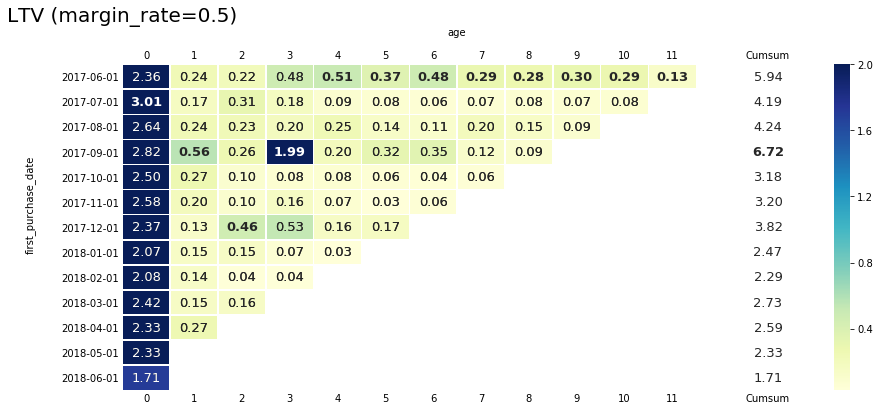

In [41]:
LTV_05, LTV_pivot_05 = get_LTV_pivot(0.5)

LTV_heatmap(LTV_pivot_05, 0.5)

Абсолютное большинство, как мы уже заметили по heatmap <b>Retention</b> делают 1 заказ и больше не возвращаются. То же самое подтверждает heatmap <b>LTV</b> - средний показатель нулевого месяца (после которого обычно все уходят) - 2,5 т.р., а далее он падает до 0,2 т.р.<br/><br/>
Отличается первая когорта, по которой средний показатель в 2 раза выше, чем по остальным когортам, - в районе 0,4 т.р.<br/>

И примечателен 3ий месяц 4ой когорты - 2 т.р. Необходимо проверить, с чем это связано. Учитывая, что <b>Retention</b> в этом периоде по этой когорте не имеет никакого всплеска, это значит, что этот <b>LTV</b> сделало "оставшееся" количество клиентов, т.е. небольшое (по сравнению с начальным количеством клиентов в когорте, которые "сделали" 2,82 т.р. <b>LTV</b>).<br/><br/>

Накопительным итогом <b>LTV</b> 4ой когорты 6,72 т.р., 1ой когорты - 5,94 т.р. Остальные вогорты имеют показатель <b>LTV</b> в 4 т.р. и ниже.

<a name="3.4.2."></a><br/>
<b>3.4.2. LTV при margin_rate = 1</b>.<br/>
<font size="2">([к содержанию](#0.0))</font><br/>

Теперь посмотрим на heatmap <b>LTV</b> при <b>margin_rate = 1</b>:

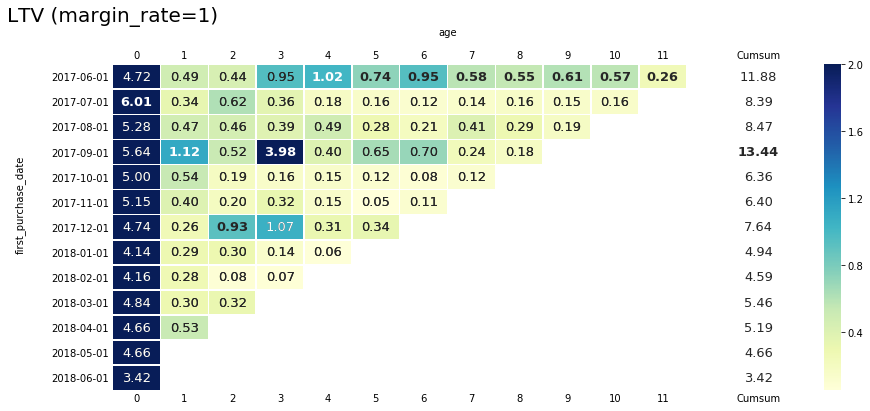

In [42]:
LTV_1, LTV_pivot_1 = get_LTV_pivot(1)
LTV_heatmap(LTV_pivot_1, 1)

Ожидаемо, что показатели отличаются ровно вдвое. Те же самые признаки лидерства первой когорты сохраняются.

<a name="4."></a><br/>
<font size="5"><b>4. Анализ данных по маркетингу</b></font>.<br/>
<font size="2">([к содержанию](#0.0))</font><br/>
* 4.1. Сколько денег потратили? Всего / на каждый источник / по времени?<br/>
Сколько стоило привлечение одного покупателя из каждого источника?<br/>
* 4.2. На сколько окупились расходы? (ROI)

<br/>
Данные по затратам будем анализировать параллельно с анализом выручки для получения полной картины о том, как одно оправдывает другое.<br/><br/>
Работать будем с датафреймами <b>costs</b> (для анализа затрат) и <b>orders</b> (для анализа выручки).

<a name="4.1."></a><br/>
<b>4.1. Сколько денег потратили? Всего / на каждый источник / по времени?<br/>
Сколько стоило привлечение одного покупателя из каждого источника?<br/></b><br/>
<font size="2">([к содержанию](#0.0))</font><br/>

Сначала подготовим данные и создадим датафрейм с 2 строками и 1 столбцом, где будут указаны суммарная выручка и суммарные затраты:

In [43]:
costs_copy = costs.copy()
orders_copy = orders.copy()

costs_copy['date'] = costs_copy['date'].values.astype('datetime64[M]') 
costs_grouped = costs_copy.groupby('date').agg({'costs': 'sum'})

In [44]:
orders_copy['date_of_purchase'] = orders_copy['date_of_purchase'].astype('datetime64[M]')
orders_grouped = orders_copy.groupby('date_of_purchase').agg({'revenue': 'sum'})

In [45]:
data = {'summary': [round(orders_grouped.sum().values[0], 2),round(costs_grouped.sum().values[0], 2)]}
rev_costs = pd.DataFrame(data=data, index=['revenue', 'costs'])

<a name="4.1.1."></a><br/>
<b>4.1.1. График соотношения между затратами и выручкой</b>.<br/>
<font size="2">([к содержанию](#0.0))</font><br/>

Построим график соотношения между суммарными затратами и суммарной выручкой:

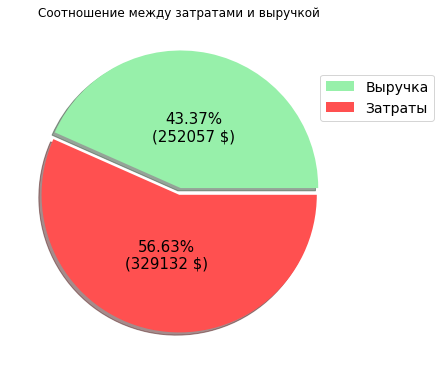

In [46]:
plt.style.use('seaborn-pastel')
summary = rev_costs.values.sum()

def func_pct(pct):
    value = float(pct/100.*summary)
    return "{:.2f}%\n({:.0f} $)".format(pct, value)

explode = (0.05, 0)  # сектор 'ultra' немного выдвинем

ax_pie = rev_costs.plot(kind='pie', y='summary', fontsize=15, use_index=False, shadow=True, explode=explode,
                        title = 'Соотношение между затратами и выручкой', pctdistance=0.45, figsize=(15,5), 
                        autopct=lambda pct: func_pct(pct), colors=['#97F0AA', '#ff5050'], labels=None)

plt.tight_layout(pad=0)

legend = ax_pie.legend(['Выручка', 'Затраты'], bbox_to_anchor=(0.89,0.87), prop={'size':14})
y_label = ax_pie.set_ylabel('')

<b>Суммарная выручка - 252 тыс. т.р.</b><br/>
<b>Суммарные затраты - 329 тыс. т.р.</b><br/><br/>

Затраты превышают выручку, пока что бизнес работает в убыль. Это плохой знак, но пока нет возможности сказать, что ситуация критическая - вполне возможно, что эти вложения в чуть более длительном периоде времени окупятся.

<a name="4.1.2."></a><br/>
<b>4.1.2. Помесячная выручка с отображением вклада каждой когорты</b>.<br/>
<font size="2">([к содержанию](#0.0))</font><br/>

Заодно посмотрим, какой "вклад" выручку вносит каждая когорта каждый месяц:

In [47]:
orders_area = orders.copy()

orders_area['date_of_purchase'] = orders_area['date_of_purchase'].astype('datetime64[M]')

first_orders_month = orders_area.groupby('uid').agg({'date_of_purchase': 'min'}).reset_index()
first_orders_month.columns = ['uid', 'first_purchase_date']

cohort_sizes = first_orders_month.groupby('first_purchase_date').agg({'uid': 'nunique'}).reset_index()
cohort_sizes.columns = ['first_purchase_date', 'n_buyers']

orders_first_orders_month = orders_area.merge(first_orders_month, on='uid')
cohorts = (orders_first_orders_month
                                    .groupby(['date_of_purchase', 'first_purchase_date'])
                                    .agg({'revenue': 'sum'})
                                    .reset_index()
          )
orders_area_plot = cohorts.merge(cohort_sizes, on='first_purchase_date')
time_diff = orders_area_plot['date_of_purchase'] - orders_area_plot['first_purchase_date']
orders_area_plot['age'] = time_diff / np.timedelta64(1, 'M')
orders_area_plot['age'] = orders_area_plot['age'].round().astype('int')

orders_pivot = orders_area_plot.pivot_table(index="first_purchase_date", columns="age", 
                                            values="revenue", aggfunc="sum")

orders_area_plot_hv = orders_pivot.reset_index()

orders_area_plot_hv = orders_pivot.reset_index()
xticks_1 = [i for i in range(len(orders_area_plot_hv))]
xticks_2 = orders_area_plot_hv['first_purchase_date'].astype('str').tolist()
xticks_2 = [element.split('-')[0] + '-' + element.split('-')[1] for element in xticks_2]

orders_area_plot_hv = orders_area_plot_hv.drop('first_purchase_date', axis=1)
orders_area_plot_hv = orders_area_plot_hv.T.reset_index().fillna(0)

cohorts = ['cohort' + str(i) for i in range(len(orders_area_plot_hv))]
areas = ['area' + str(i) for i in range(len(orders_area_plot_hv))]
cohorts_filled = list()
new_areas = list()

for i in range(len(cohorts)-1):
    prev_list = orders_area_plot_hv.loc[:,i].tolist()
    for count in range(i+1):
        prev_list = [0] + prev_list
        prev_list.pop(-1)
    cohorts_filled.append(prev_list)

dims = dict(kdims='месяц', vdims='выручка')

# colors
from pylab import *

cmap = cm.get_cmap('Blues', 12)    # PiYG
colors = list()

for i in range(cmap.N):
    rgb = cmap(i)[:3] 
    colors.append(matplotlib.colors.rgb2hex(rgb))
colors = colors[::-1]
#-----------------------------------


for i in range(len(cohorts_filled)):
    areas[i] = hv.Area(cohorts_filled[i], label=str(i+1), **dims).opts(color=colors[i])
    new_areas.append(areas[i])
    
opts.defaults(opts.Area(fill_alpha=0.75, height=500, width=900))
overlay = new_areas[0]
for new_area in new_areas[1:]:
    overlay = overlay * new_area

xticks = list(zip(xticks_1, xticks_2))

hv.Area.stack(overlay).relabel("Помесячная выручка с отображением вклада каждой когорты").opts(
                                                          legend_position='top_left', 
                                                          xticks=xticks, text_font_size='11pt',
                                                          fontsize={'title': 12, 'labels': 12, 
                                                                    'xticks': 10, 'yticks': 10})

:Overlay
   .Area.A_1  :Area   [месяц]   (выручка,Baseline)
   .Area.A_2  :Area   [месяц]   (выручка,Baseline)
   .Area.A_3  :Area   [месяц]   (выручка,Baseline)
   .Area.A_4  :Area   [месяц]   (выручка,Baseline)
   .Area.A_5  :Area   [месяц]   (выручка,Baseline)
   .Area.A_6  :Area   [месяц]   (выручка,Baseline)
   .Area.A_7  :Area   [месяц]   (выручка,Baseline)
   .Area.A_8  :Area   [месяц]   (выручка,Baseline)
   .Area.A_9  :Area   [месяц]   (выручка,Baseline)
   .Area.A_10 :Area   [месяц]   (выручка,Baseline)
   .Area.A_11 :Area   [месяц]   (выручка,Baseline)

Каждая когорта вносит максимальный вклад в выручку в первый (нулевой) месяц своего присутствия, на следующий месяц вклад сильно снижается и потом постепенно идет ближе к нулю. Ожидаемо, учитывая, что показатель <b>Retention</b> ведёт себя точно так же.<br/>
Тем не менее, 4 и 5 когорты имеют небольшой всплеск на 3 и 2 месяцы своей жизни соответственно. С учетом того, что особого всплеска по <b>Retenion</b> в эти периоды по этим когортам не наблюдается, можно сделать вывод, что те, оставшиеся в когортах клиенты, сделали достаточно большое количество заказов, или средний чек сильно вырос.<br/>
Стоит отметить, что февраль 2018г. "подкосил" абсолютно все когорты без исключения, даже ту, которая только "присоединилась" к остальным - 8ую: выручка нулевого месяца упала с 35000 т.р. до 20000т.р. по сравнению с предыдущей 7ой когортой. Необходимо проанализировать этот месяц по части проведения рекламных кампаний и уровня их эффективности.

<a name="4.1.3."></a><br/>
<b>4.1.3. Затраты на рекламу по времени</b>.<br/>
<font size="2">([к содержанию](#0.0))</font><br/>

In [48]:
from bokeh.models.widgets import DataTable, DateFormatter, TableColumn, RadioButtonGroup, Select
from bokeh.plotting import ColumnDataSource, figure, show
from bokeh.io import output_file, reset_output, output_notebook
from bokeh.models.widgets import Tabs, Panel, Div
from bokeh.models import Span, Range1d, CustomJS, TextInput, HoverTool, FactorRange
from bokeh.models import WheelZoomTool, NumeralTickFormatter, Legend, BoxAnnotation
from bokeh.layouts import layout, row, column, widgetbox, gridplot
from bokeh.models import SingleIntervalTicker, LinearAxis, Label, Span, CheckboxGroup
from bokeh.transform import dodge
output_notebook()

Loading BokehJS ...

In [49]:
source = ColumnDataSource(data=costs_grouped)

p = figure(x_axis_type='datetime',
           plot_width=900, plot_height=500, tools="tap, pan, wheel_zoom, reset", y_axis_label="т.р.",
           title="Затраты на рекламу по месяцам")

costs_per_time_bar = p.vbar(x='date', top='costs', width=1300000000, source=source, 
color="#83C2BA", line_color="black", nonselection_fill_alpha=0.2)
p.add_tools(HoverTool(renderers=[costs_per_time_bar], tooltips=[("", "@costs{1.0}")]))
p.xaxis[0].ticker.desired_num_ticks = 15
p.xgrid.grid_line_color = None

p.ygrid.band_fill_alpha = 0.05
p.ygrid.band_fill_color = "navy"

p.xaxis.major_label_text_font_size = "11pt"
p.yaxis.major_label_text_font_size = "11pt"
p.y_range.start = 0
show(p)

Самый активный период вливаний денег в рекламу - с октября 2017г. по март 2018г. (включительно).<br/>
В остальные периоды активность по заказу рекламы есть, но уже значительно ниже.<br/><br/>

Посмотрим на эффективность каждого рекламного канала.

<a name="4.1.4."></a><br/>
<b>4.1.4. Затраты по источникам рекламы</b>.<br/>
<font size="2">([к содержанию](#0.0))</font><br/>

Посмотрим на затраты по источникам:

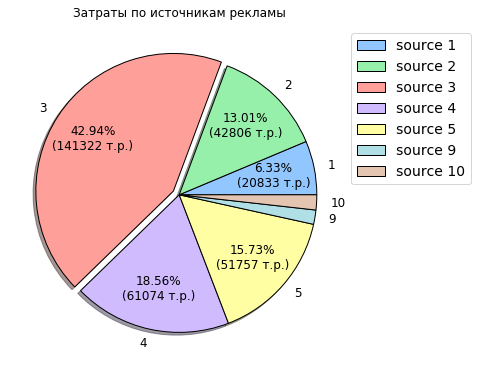

In [50]:
costs_per_source = costs.groupby('source_id').agg({'costs': 'sum'})

summary = costs_per_source.values.sum()
labels = costs_per_source.index

def func_pct(pct):
    if pct > 6.32:
        value = float(pct/100.*summary)
        return "{:.2f}%\n({:.0f} т.р.)".format(pct, value)
    else:
        return ''

explode = (0, 0, 0.05, 0, 0, 0, 0)
colors = plt.rcParams['axes.prop_cycle'].by_key()['color']
colors.append('#E3C5B1')

ax_pie = costs_per_source.plot(kind='pie', y='costs', fontsize=12, use_index=False, shadow=True, explode=explode,
                        title = 'Затраты по источникам рекламы', pctdistance=0.7, colors=colors,
                        wedgeprops={"edgecolor":"0",'linewidth': 1, 'linestyle': 'solid', 'antialiased': True},
                        figsize=(15,5), labels=labels, autopct=lambda pct: func_pct(pct))

plt.tight_layout(pad=0)
legend_labels = list()
for label in labels:
    legend_labels.append('source ' + str(label))

legend = ax_pie.legend(legend_labels, bbox_to_anchor=(0.98,0.99), prop={'size':14})
y_label = ax_pie.set_ylabel('')

Самый большой канал рекламы, куда вкладываются, "источник 3" - более 40%.<br/> По 1, 2 и 4 примерно одинаковые затраты - в районе 15%.<br/> На 9 и 10 приходится менее 5% от бюджета.<br/><br/>

Теперь стоит посмотреть, какое количество новых пользователей привлекает каждый источник, чтобы понять, насколько он эффективен:

<a name="4.1.5."></a><br/>
<b>4.1.5. Количество привлеченных пользователей по источникам рекламы</b>.<br/>
<font size="2">([к содержанию](#0.0))</font><br/>

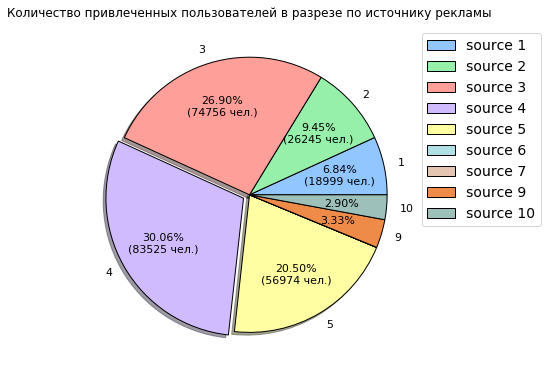

In [51]:
visits1 = visits.sort_values(by='session_start')

uid_per_source = visits1.groupby('source id').agg({'uid': 'nunique'})

summary = uid_per_source.values.sum()
labels_for_legend = uid_per_source.index
labels_for_pie = [label if uid_per_source.loc[label].values[0] > 100 else '' for label in uid_per_source.index]

def func_pct(pct):
    if pct > 5:
        value = float(pct/100.*summary)
        return "{:.2f}%\n({:.0f} чел.)".format(pct, value)
    elif pct > 1:
        return "{:.2f}%".format(pct)

explode = (0, 0, 0, 0.05, 0, 0, 0, 0, 0)
colors = plt.rcParams['axes.prop_cycle'].by_key()['color']
colors.append('#E3C5B1')
colors.append('#EF8B49')
colors.append('#9EC0BA')

ax_pie = uid_per_source.plot(kind='pie', y='uid', fontsize=11, use_index=False, shadow=True, explode=explode,
                        title = 'Количество привлеченных пользователей в разрезе по источнику рекламы', 
                        pctdistance=0.67, colors=colors,
                        wedgeprops={"edgecolor":"0",'linewidth': 1, 'linestyle': 'solid', 'antialiased': True},
                        figsize=(15,5), labels=labels_for_pie, autopct=lambda pct: func_pct(pct))

plt.tight_layout(pad=0)
legend_labels = list()
for label in labels_for_legend:
    legend_labels.append('source ' + str(label))

legend = ax_pie.legend(legend_labels, bbox_to_anchor=(0.98,0.99), prop={'size':14})
y_label = ax_pie.set_ylabel('')

Тот самый 3 канал, на который тратится больше всего денег, приносит нам меньше людей, чем четвертый, на который мы тратим менее 20% от бюджета.<br/><br/>



<a name="4.1.6."></a><br/>
<b>4.1.6. Выручка по источникам рекламы</b>.<br/>
<font size="2">([к содержанию](#0.0))</font><br/>

Для полноты картины нам не хватает данных, какую выручку принесли пользователи, которые пришли по каждому из каналов рекламы. Отобразим эти данные:

In [52]:
orders.head()

,date_of_purchase,revenue,uid
0,2017-06-01 00:10:00,17.00,10329302124590727494
1,2017-06-01 00:25:00,0.55,11627257723692907447
2,2017-06-01 00:27:00,0.37,17903680561304213844
3,2017-06-01 00:29:00,0.55,16109239769442553005
4,2017-06-01 07:58:00,0.37,14200605875248379450


In [53]:
visits.head()

,device,session_end,source id,session_start,uid,session_umd,session_week,session_month,session_duration
0,touch,2017-12-20 17:38:00,4,2017-12-20 17:20:00,16879256277535980062,2017-12-20,51,2017-12,18
1,desktop,2018-02-19 17:21:00,2,2018-02-19 16:53:00,104060357244891740,2018-02-19,8,2018-02,28
2,touch,2017-07-01 01:54:00,5,2017-07-01 01:54:00,7459035603376831527,2017-07-01,26,2017-07,0
3,desktop,2018-05-20 11:23:00,9,2018-05-20 10:59:00,16174680259334210214,2018-05-20,20,2018-05,24
4,desktop,2017-12-27 14:06:00,3,2017-12-27 14:06:00,9969694820036681168,2017-12-27,52,2017-12,0


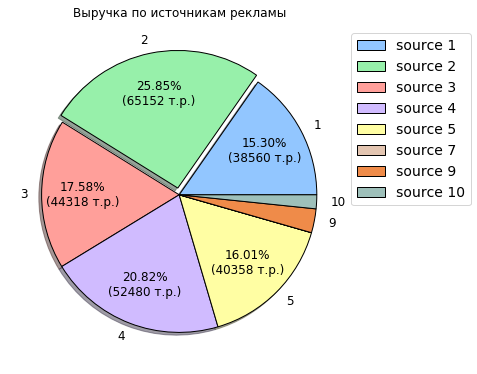

In [54]:
first_source_per_user = visits.groupby('uid').agg({'source id': 'first'})
rev_per_source = orders.merge(first_source_per_user, on='uid')
rev_per_source = rev_per_source.groupby('source id').agg({'revenue': 'sum'})

summary = rev_per_source.values.sum()
labels_for_legend = rev_per_source.index
labels_for_pie = [label if rev_per_source.loc[label].values[0] > 100 else '' for label in rev_per_source.index]

def func_pct(pct):
    if pct > 5:
        value = float(pct/100.*summary)
        return "{:.2f}%\n({:.0f} т.р.)".format(pct, value)
    else:
        return ''

explode = (0, 0.05, 0, 0, 0, 0, 0, 0)
colors = plt.rcParams['axes.prop_cycle'].by_key()['color']
colors.pop(-1)
colors.append('#E3C5B1')
colors.append('#EF8B49')
colors.append('#9EC0BA')

ax_pie = rev_per_source.plot(kind='pie', y='revenue', fontsize=12, use_index=False, shadow=True, explode=explode,
                        title = 'Выручка по источникам рекламы', pctdistance=0.7, colors=colors,
                        wedgeprops={"edgecolor":"0",'linewidth': 1, 'linestyle': 'solid', 'antialiased': True},
                        figsize=(15,5), labels=labels_for_pie, autopct=lambda pct: func_pct(pct))

plt.tight_layout(pad=0)
legend_labels = list()
for label in labels_for_legend:
    legend_labels.append('source ' + str(label))

legend = ax_pie.legend(legend_labels, bbox_to_anchor=(0.98,0.99), prop={'size':14})
y_label = ax_pie.set_ylabel('')

2ой канал принес больше всего дохода, за ним идет 4ый. И потом тройка примерно одинаковых результатов показали 1, 3 и 5 каналам рекламы.<br/><br/>

В целом, никакой прямой связи между затратами на рекламу и количеством привлеченных пользователей/выручкой нет.<br/><br/>
Необходимо всё отобразить рядом, чтобы понять эффективность каждого рекламного канала.

<a name="4.1.7."></a><br/>
<b>4.1.7. Затраты, выручка и количество привлеченных пользователей по источникам рекламы</b>.<br/>
<font size="2">([к содержанию](#0.0))</font><br/>

In [55]:
# покупатели по каналам
first_source_per_user = visits.groupby('uid').agg({'source id': 'first'})
client_per_source = orders.merge(first_source_per_user, on='uid')
client_per_source = client_per_source.groupby('source id').agg({'uid': 'nunique'})

rev_uid_costs_per_source = pd.concat([costs_per_source, rev_per_source, 
                                      uid_per_source, client_per_source],axis=1).fillna(0)
rev_uid_costs_per_source = rev_uid_costs_per_source.reset_index()
rev_uid_costs_per_source['index'] = 'source ' + rev_uid_costs_per_source['index'].astype('str')
rev_uid_costs_per_source = rev_uid_costs_per_source.set_index('index')
rev_uid_costs_per_source.columns = ['costs', 'revenue', 'uid', 'clients']


source = ColumnDataSource(data=rev_uid_costs_per_source)

p = figure(x_range=rev_uid_costs_per_source.index.values, 
           x_axis_label="Канал рекламы", y_axis_label="т.р./чел",
           plot_width=950, plot_height=500, tools="tap, pan, wheel_zoom, reset",
           title="Затраты, выручка и кол-во привлеченных пользователей и покупателей по источникам рекламы")

costs_bar = p.vbar(x=dodge('index', -0.25, range=p.x_range), top='costs', width=0.15, source=source,
color="#e84d60", legend_label="costs", line_color="black", nonselection_fill_alpha=0.2)

rev_bar = p.vbar(x=dodge('index', -0.1, range=p.x_range), top='revenue', width=0.15, source=source,
color="#83C2BA", legend_label="revenue", line_color="black")

users_bar = p.vbar(x=dodge('index', 0.05, range=p.x_range), top='uid', width=0.15, source=source,
color="#BE94DC", legend_label="visitors", line_color="black")

clients_bar = p.vbar(x=dodge('index', 0.2, range=p.x_range), top='clients', width=0.15, source=source,
color="#D79B11", legend_label="buyers", line_color="black")

p.legend.click_policy="hide"
p.add_tools(HoverTool(renderers=[costs_bar], tooltips=[("Затраты", "@costs{1.0}")]))
p.add_tools(HoverTool(renderers=[users_bar], tooltips=[("Кол-во уник. пользователей", "@uid")]))
p.add_tools(HoverTool(renderers=[rev_bar], tooltips=[("Выручка", "@revenue{1.0}")]))
p.add_tools(HoverTool(renderers=[clients_bar], tooltips=[("Кол-во клиентов", "@clients")]))
p.yaxis[0].formatter = NumeralTickFormatter(format='0,0')

p.xgrid.grid_line_color = None

p.ygrid.band_fill_alpha = 0.05
p.ygrid.band_fill_color = "navy"

p.xaxis.major_label_text_font_size = "11pt"
p.yaxis.major_label_text_font_size = "11pt"

show(p)

<a name="4.1.8."></a><br/>
<b>4.1.8. Сколько стоило привлечение одного покупателя из каждого источника?</b>.<br/>
<font size="2">([к содержанию](#0.0))</font><br/>

Выведем информацию по стоимости привлечения одного клиента по каждому из каналов рекламы:

In [56]:
rev_uid_costs_per_source['price_for_client'] = rev_uid_costs_per_source['costs']/rev_uid_costs_per_source['clients']
rev_uid_costs_per_source['price_for_client'] = rev_uid_costs_per_source['price_for_client'].round(2)
rev_uid_costs_per_source['price_for_client'].sort_values(ascending=False).to_frame()

,price_for_client
index,
source 3,15.47
source 2,9.90
source 5,7.57
source 4,6.22
source 1,5.57
source 10,4.69
source 9,3.90
source 7,0.00
source 6,NaN


Ожидаемо, что лидер по дороговизне привлечения одного пользователя - 3 канал. За ним идет 2 канал, но он себя в окупает, в отличие от идущих за ним 4 и 5.

<a name="4.1.9."></a><br/>
<b>4.1.9. Выводы по выгодности использования каждого рекламного канала</b>.<br/>
<font size="2">([к содержанию](#0.0))</font><br/>

Какие выводы по рекламным каналам мы можем сделать:
* <b>1, 2 и 9 каналы</b> работают хорошо: выручка выше расхода, при этом есть пусть не огромный, но приток новых пользователей, который сопоставим с размером вложенных средств;
* <b>3ий канал</b>, в который мы вкладываемся больше всего, убыточен - 44000 т.р. дохода против 140000 т.р. расхода, при этом он даже не лидер по количеству привлеченных клиентов, но привлеченный с его помощью пользователь самый дорогой;
* <b>4ый канал</b> также невыгоден, т.к. расходы превышают доход, тем не менее он является лидером по количеству привлеченных пользователей, даже по сравнению с 3 каналом, в который вложено в 2,5 раза больше;
* <b>5ый канал</b> по своим характеристикам схож с 4ым;
* <b>6 и 7 канал</b> не являются затратными (мы в них не вкладываемся), на двоих они привлекли 40 новых пользователей, из них только 1 стал клиентом, и он принес нам 1,22 т.р. выручки;
* <b>10 канал</b> работает в минус.
<br/><br/>
<font size="4"><b>Итог:</b></font><br/> 
* <b>2 канал</b> самый перспективный с точки зрения доходов, т.к. привлекает тех клиентов, кто совершает достаточно большие покупки;
* <b>4 канал</b> самый перспективный с точки зрения привлечения новых клиентов, тем не менее он убыточен для компании, по крайней мере, на рассматриваем сроке длиной в 1 год; 
* <b>3 каналом</b> совершенно не окупается и при этом не является лидером по отдаче по количеству новых пользователей и клиентов.<br/> <br/> 

В связи с этим, рекомендутся перераспределить вложения в рекламные каналы и с 3 канала часть средств направить на самые перспективные 2 (в первую очередь) и 1. По 3 и 4 каналам необходимо провести исследования и разобраться, почему по ним такая низкая конверсия посетителя в покупателя, и провести соответствующие мероприятия для улучшения этих показателей. <br/> <br/> 

В целом, рекламную кампанию нельзя назвать успешной, по крайней мере на рассматриваем нами промежутке в 1 год.

<a name="4.2."></a><br/>
<b>4.2. Анализ посещаемости ресурса по типу устройства</b>.<br/>
<font size="2">([к содержанию](#0.0))</font><br/>

Для этого обратимся к датафрейму <b>visits</b>:

In [57]:
visits.head()

,device,session_end,source id,session_start,uid,session_umd,session_week,session_month,session_duration
0,touch,2017-12-20 17:38:00,4,2017-12-20 17:20:00,16879256277535980062,2017-12-20,51,2017-12,18
1,desktop,2018-02-19 17:21:00,2,2018-02-19 16:53:00,104060357244891740,2018-02-19,8,2018-02,28
2,touch,2017-07-01 01:54:00,5,2017-07-01 01:54:00,7459035603376831527,2017-07-01,26,2017-07,0
3,desktop,2018-05-20 11:23:00,9,2018-05-20 10:59:00,16174680259334210214,2018-05-20,20,2018-05,24
4,desktop,2017-12-27 14:06:00,3,2017-12-27 14:06:00,9969694820036681168,2017-12-27,52,2017-12,0


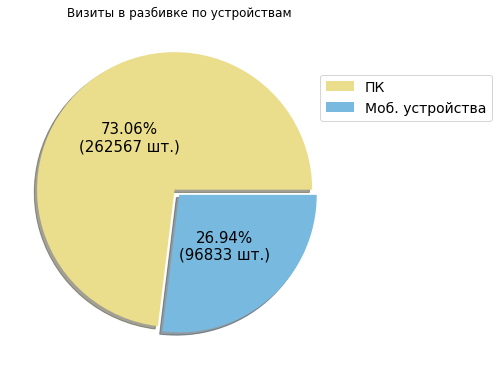

In [58]:
visits_by_device = visits.groupby('device').agg({'uid': 'count'})
summary = visits_by_device.values.sum()

def func_pct(pct):
    value = float(pct/100.*summary)
    return "{:.2f}%\n({:.0f} шт.)".format(pct, value)

explode = (0.05, 0)

ax_pie = visits_by_device.plot(kind='pie', y='uid', fontsize=15, use_index=False, shadow=True, explode=explode,
                        title = 'Визиты в разбивке по устройствам', pctdistance=0.5, figsize=(15,5), 
                        autopct=lambda pct: func_pct(pct), colors=['#EADD8B', '#78B9DF'], labels=None)

plt.tight_layout(pad=0)

legend = ax_pie.legend(['ПК', 'Моб. устройства'], bbox_to_anchor=(0.89,0.87), prop={'size':14})
y_label = ax_pie.set_ylabel('')

Приблизительно 75% посещений нашего ресурса совершены с настолького ПК. Учитывая нынешнее время, 25 % посещаемости с мобильных устройств - довольно слабый показатель. Вероятно, причиной тому является тот факт, что отдельного приложения <b>Яндекс.Афиша</b> для мобильных устройств не существует, а сам сайт не так удобен для использования с мобильного устройства, как с персонального компьютера, что является причиной такой низкой "явки" пользователей-владельцев этих устройств.<br/>
В список причин именно такого распределения можно добавить особенность рынка - намного удобнее выбирать место с компьютера, чем с телефона. И такие покупки совершаются не на ходу в течение дня, а уже вечером и в спокойной обстановке.<br/>

Необходимо протестировать мобильную версию сайта по части удобства использования, чтобы установить, является ли это причиной низкого показателя посещаемости сайта с помощью мобильных устройств.

<a name="4.3."></a><br/>
<b>4.3. САС, ROMI</b>.<br/>
<font size="2">([к содержанию](#0.0))</font><br/>

Ранее мы уже формировали датафрейм с <b>LTV</b>, возьмем его же для того, чтобы посчитать <b>CAC</b> и <b>ROMI (для margin_rate=0.5 и 1)</b>:

<a name="4.3.1."></a><br/>
<b>4.3.1. Функции для heatmap и stacked-bar</b>.<br/>
<font size="2">([к содержанию](#0.0))</font><br/>

In [59]:
# функция для получения сводной таблицы по ROMI в зависимости от установленного margin_rate

def get_ROMI_pivot(LTV_pivot, margin_rate=0.5):
    LTV_copy = LTV_pivot.copy()
    costs_cac = costs.copy()
    costs_cac['date'] = costs_cac['date'].astype('datetime64[M]')

    all_costs = costs_cac.groupby('date')['costs'].sum().to_frame()

    final_cac = LTV_copy.merge(all_costs, left_on='first_purchase_date', right_on='date')
    final_cac['cac'] = final_cac['costs']/final_cac['n_buyers']
    final_cac['romi'] = final_cac['ltv']/final_cac['cac']

    romi_pivot = final_cac.pivot_table(index='first_purchase_date', columns='age',
                                       values='romi').round(2)

    romi_pivot_cumsum = romi_pivot.cumsum(axis=1).round(2)
    
    return romi_pivot, romi_pivot_cumsum

In [60]:
# функция для вывода heatmap ROMI

def romi_heatmap(romi_pivot, margin_rate=0.5):
    romi_pivot_copy = romi_pivot.copy()

    romi_pivot_copy.loc[:, ''] = np.nan
    romi_pivot_copy.loc[:, 'Cumsum'] = romi_pivot_copy.sum(axis=1)
    romi_pivot_copy

    from matplotlib.colors import ListedColormap

    max_cumsum = romi_pivot_copy.loc[:, 'Cumsum'].max()
    max_in_each_column = np.max(romi_pivot_copy.iloc[:, :-1], axis=0)

    max_in_each_column

    plt.figure(figsize=(15,6))

    # общая
    heatmap = sns.heatmap(romi_pivot_copy, fmt='.2f', annot=True, cmap=ListedColormap(['white']), 
                          vmax=0.5, linewidths=.5, cbar=False, 
                          mask=((romi_pivot_copy == max_cumsum) | (romi_pivot_copy == max_in_each_column)),
                          annot_kws={"size": '13'})

    # нежирные
    heatmap = sns.heatmap(romi_pivot_copy.iloc[:, :-1], fmt='.2f', annot=True, cmap='YlGnBu', vmax=0.5, 
                          linewidths=.5,mask=romi_pivot_copy.iloc[:, :-1] == max_in_each_column, 
                          annot_kws={"size": '13'})

    # жирные
    heatmap = sns.heatmap(romi_pivot_copy.iloc[:, :-1], fmt='.2f', annot=True, cmap='YlGnBu', vmax=0.5,
                          linewidths=.5,mask=romi_pivot_copy.iloc[:, :-1] != max_in_each_column,
                          annot_kws={"weight": "bold", "size": '13'},
                          cbar=False)

    # жирным общее максимальное
    heatmap = sns.heatmap(romi_pivot_copy, fmt='.2f', annot=True, cmap=ListedColormap(['white']), 
                          vmax=0.5, linewidths=.5, cbar=False,
                          mask=romi_pivot_copy != max_cumsum,
                          annot_kws={"weight": "bold", "size": '13'})

    heatmap.tick_params(axis="x", bottom=True, top=True, labelbottom=True, labeltop=True)

    heatmap.xaxis.set_label_position('top')
    heatmap.xaxis.labelpad = 15
    heatmap.yaxis.set_label_coords(-0.13, 0.57)
    y_labels = heatmap.set_yticklabels(romi_pivot_copy.index.date)
    heatmap.tick_params(length=0)
    title='ROMI (margin_rate={})'.format(margin_rate)
    title = plt.title(title, x=0.0, fontsize=20)

In [61]:
# функция для построения stackedbar-plot

def romi_stacked_bar(romi_pivot, margin_rate=0.5):
    romi_stacked = romi_pivot.fillna(0).reset_index()
    romi_stacked['first_purchase_date'] = (romi_stacked['first_purchase_date']
                                           .apply(lambda x: str(x).split(' 00:00:00')[0])
                                          )
    romi_stacked['first_purchase_date'] = (romi_stacked['first_purchase_date']
                                           .apply(lambda x: str(x).split('-')[0] + '-' + str(x).split('-')[1])
                                          )
    romi_stacked = romi_stacked.rename(columns={'first_purchase_date': 'index'}).set_index('index')


    dates = romi_stacked.index.values.tolist()
    ages = [str(age) for age in romi_stacked.columns.values] 
    colors = ["#c9d9d3", "#718dbf", "#e84d60", 'skyblue', 'steelblue', 'blanchedalmond',
              'khaki', 'peru', 'lightgreen', 'plum', 'salmon', '#777E83']

    #data1
    data1 = {'index' : dates}
    for age in ages:
        data1[age] = romi_stacked[int(age)].tolist()
    
    columns_sum = romi_pivot.cumsum(axis=1).round(2)
    max_sum_per_col = columns_sum.max()
    max_sum = max_sum_per_col.max()
    if max_sum < 1:
        y_max = 1.2
    else:
        y_max = max_sum * 1.1
    
    p = figure(x_range=dates, plot_height=400, plot_width=750, 
               title="Вклад в ROMI по возрастам когорт\n(margin_rate={})".format(margin_rate),
               y_range=(0, y_max), 
               tools="hover, wheel_zoom, pan, reset", tooltips="$name: @$name{1.11}")

    vbar = p.vbar_stack(ages, x='index', width=0.9, color=colors, source=data1, line_color="black")

    green_box = BoxAnnotation(bottom=1.0, fill_color='green', fill_alpha=0.1)
    p.add_layout(green_box)

    p.y_range.start = 0
    p.x_range.range_padding = 0.1
    p.xgrid.grid_line_color = None
    p.axis.minor_tick_line_color = None
    p.outline_line_color = None
    p.xaxis.major_label_orientation = 3.14/3.5

    p.xaxis.major_label_text_font_size = "11pt"
    p.yaxis.major_label_text_font_size = "11pt"

    legend = Legend(items=[(age, [part]) for (age, part) in zip(ages, vbar)], location=(0, 30))

    p.add_layout(legend, 'right')
    p.legend.click_policy="hide"

    show(p)

Получим сводные таблицы для <b>ROMI</b> при обоих показателях margin_rate (0.5 и 1):

In [62]:
romi_pivot_05, romi_pivot_cumsum_05 = get_ROMI_pivot(LTV_05, 0.5)
romi_pivot_1, romi_pivot_cumsum_1 = get_ROMI_pivot(LTV_1, 1)

<a name="4.3.2."></a><br/>
<b>4.3.2. ROMI при margin_rate = 0.5</b>.<br/>
<font size="2">([к содержанию](#0.0))</font><br/>

Исследуем <b>ROMI</b> при <b>margin_rate = 0.5</b>:

Строим графики:

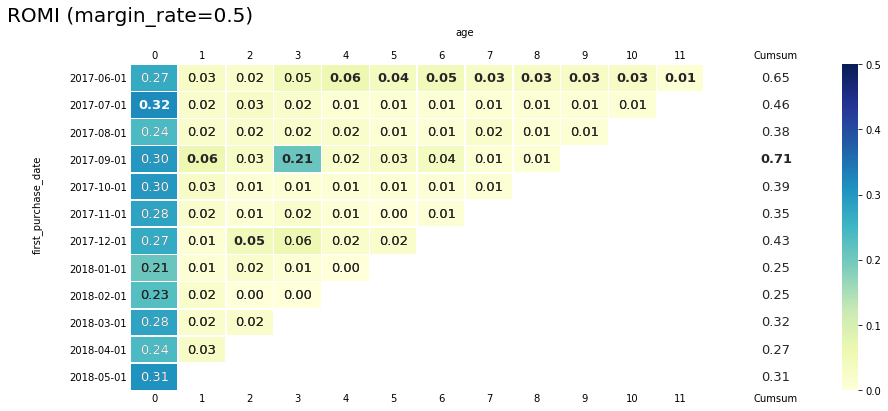

In [63]:
romi_heatmap(romi_pivot_05, margin_rate=0.5)

Визуализируем полученные по <b>ROMI (margin_rate=0.5)</b> данные через <b>stackedbar-график</b>:

In [64]:
romi_stacked_bar(romi_pivot_05, margin_rate=0.5)

Ни одна из когорт не достигает "зеленой зоны" <b>ROMI</b>, т.е. накопленным итогом не превышает значение 1.0.<br/>

Это значит, что на рассматриваемой дистанции (в 1 год) бизнес не окупается. А учитывая, что средний рост <b>ROMI</b> в месяц (кроме нулевого и некоторых исключений) составляет ~ 0.02 пункта, то должно пройти ещё около 2х лет, чтобы, к примеру, самые перспективные 1ая и 4ая когорты окупились.

<a name="4.3.3."></a><br/>
<b>4.3.3. ROMI при margin_rate = 1</b>.<br/>
<font size="2">([к содержанию](#0.0))</font><br/>

Теперь исследуем <b>ROMI</b> при <b>margin_rate = 1</b>:

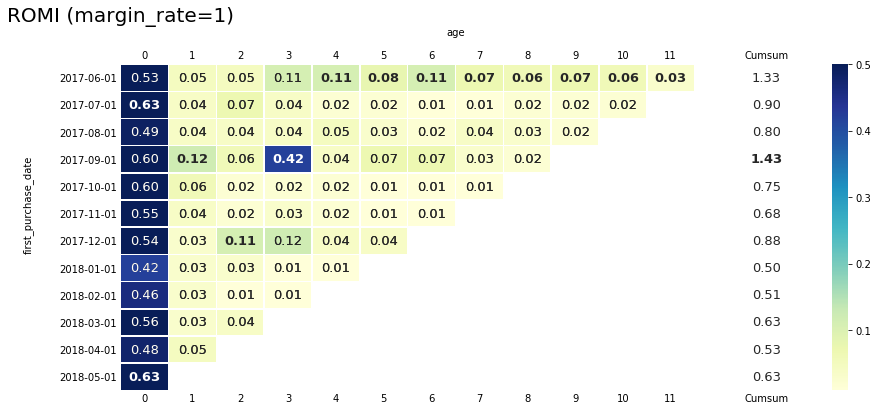

In [65]:
romi_heatmap(romi_pivot_1, margin_rate=1)

In [66]:
romi_stacked_bar(romi_pivot_1, margin_rate=1)

2 когорты (1 и 4) достигли "зеленой зоны" <b>ROMI</b>, т.е. накопленным итогом превышают значение 1.0.<br/><br/>

Тем не менее, хоть и средняя численность одной когорты во второй части рассматриваемого периода (январь-май 2018г.), их показатель по <b>ROMI</b> сильнее ниже, чем у первых когорт, поэтому можно заключить, что рекламные кампании стали привлекать менее качественных для бизнеса (которые не готовы тратить столько же, сколько клиенты из первых когорт) покупателей.

<a name="5."></a><br/>
<font size="5"><b>5. Общий вывод</b></font>.<br/>
<font size="2">([к содержанию](#0.0))</font><br/>

<font size="4"><b>5.1. Продукт и продажи</b></font>.

<b>Retention</b> у <b>Яндекс.Афиши</b> очень низкий (около 4%). Большинство сессий имеют длительность до 2 минут, т.е. люди заходят на ресурс и, сделав пару щелчков, выходят оттуда. Большая часть клиентов после первой покупки уже не возвращаются. Оставшиеся же совершают в среднем 2 покупки в месяц.<br/>
Тем не менее, есть одна когорта, самая первая, которая ведет себя необычно по сравнению со всеми остальными когортами: её <b>Retention</b> заметно выше, чем у остальных когорт (6 процентных пунктов), и совершают больше покупок в месяц (~ 4). Необходимо тщательно исследовать эту когорту: как они узнали о ресурсе, что заставляет их продолжать им пользоваться, почему среди прочих всех подобных билетных агрегаторов они выбирают <b>Яндекс.Афишу</b>. Также необходимо сделать опрос клиентов из других когорт, чтобы составить усредненный портрет клиента, который делает намного меньше покупок и котоорый с меньшей вероятностью вернется к использованию <b>Яндекс.Афиши</b>.Это приблизит нас к пониманию того, какая есть разница в среднем клиенте из 1ой и из любой другой когорты. На основании полученных данных будет возможно разработать определенные мероприятия по повышению лояльности среди клиентов, которые пользуются сайтом лишь однократно.<br/>

Также необходимо отметить, что благодаря активной рекламной кампании в период с октября 2017г. по март 2018г. включительно заметно (в 2 раза: с 13000 до 23000 посетителей) повысилась средняя численность одной отдельно взятой когорты в нулевом её месяце. Но при этом <b>Retention</b> в относительном выражении не изменился - ресурсом продолжают пользоваться всё те же ~4% клиентов.<br/>

<b>LTV</b> одного пользователя в среднем составляет 4 т.р. <b>LTV</b> 4ой и 1 когорт немного отличаются от среднего показателя - 6,72 т.р. и 5,94 т.р. соответственно.

<font size="4"><b>5.2. Маркетинг</b></font>.

Необходимо перераспределить вложения в рекламные каналы и сместить акцент с 3 канала, который особо убыточен для компании, на канале 2 и 1, которые являются довольно перспективными, учитывая текущую отдачу при текущих вложениях.  По 3 и 4 каналам необходимо провести дополнительные исследования и выяснить причины настолько низкой конверсии в покупателя и проработать и провести необходимые мероприятия для исправления ситуации. 

Отдельно отмечу как "распределяются" пользователи ресурса по устройствам: 73% визитов производится с персонального компьютера, 27% - с мобильных устройств. Это довольно сильный перевес в пользу ПК, особенно учитывая современные тренды, когда всё можно сделать через телефон. Предполагаю, что основная проблема в том, что <b>Яндекс.Афиша</b> не имеет мобильное приложение ни в <b>Play market</b>, ни в <b>Apple Store</b>, а далеко не каждый пользователь найдет удобным использовать мобильную версию сайта через мобильный браузер.<br/>
Учитывая положение дел на рынке крупных билетных агрегаторов, когда ни один из не имеет нормального мобильного приложения, которым бы активно пользовались десятки тысяч человек, стоит приложить усилия к тому, чтобы занять эту нишу. Грамотно сделанное мобильное приложение может повлиять на все показатели: от длительности сессии до <b>Retention</b>, - и поможет "перетянуть" к себе клиентов таких крупных агрегаторов как <b>Кассир.ру</b> и <b>Bileter</b>, которые уже давно у всех на слуху и многие пользуются ими по привычке, потому что ни один другой агрегатор не может предложить им ничего нового ни в плане цен, ни в плане удобства использования. К примеру, опция push-уведомлений для рассылки, например, акционных предложений или уведомлений о том, что лучше пораньше начать собираться в театр, т.к. "на вашем маршруте ожидаются пробки", может позволить серьезно повысить лояльность пользователя и увеличить как <b>Retention</b>, так и благоприятно повлять на остальные важные для бизнеса показатели.

<b>ROMI</b> при коэффициенте маржинальности 0.5 ни по одной когорте не добрался до "зеленой" зоны (значение > 1). Это говорит о том, что бизнес, в текущем его виде, убыточен. Как уже указывалось выше, необходимо пересмотреть рекламную политику компании, необходимо исследовать поведение клиентов, которые остаются и покупают дольше и чаще, чем другие, и необходимо посмотреть в сторону разработки мобильного приложения, которое, наконец, дало бы возможность всем театралам и любителям других видов творчество покупать билеты "на ходу" с комфортом.

Оставлять всё как есть категорически нельзя. За год было собрано достаточно данных для разработки новой стратегии развития. Необходимо провести все необходимые исследования, сформулировать её и применить.